**Autore del progetto:** Giada Baraldi

**dataset scelto:** credit_risk_dataset da Kaggle

**obiettivo stabilito:** Stimare la probabilità di default della controparte (cliente di un istituto di credito) supponendo che ogni record del dataset riporti le informazioni appartenenti ad un cliente.
Dal momento che non c'è un identificativo id che possa far presupporre ad un possibile ndg del cliente, decido a prescindere di non eliminare nessun record e di trattare in seguito eventuali valori missing, outlier, valori doppi.

# 0) CREO L'AMBIENTE ovvero richiamo/installo eventuali librerie che mi occorrono

In [ ]:
#questo comando mi occorre se utilizzo jupyer installato sul pc e non su colaboratory
#!pip install XGBoost

In [24]:
#importo le librerie
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedShuffleSplit, StratifiedKFold
from sklearn.feature_selection import chi2, SelectKBest, f_classif
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.metrics import r2_score

from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier, GradientBoostingClassifier

import xgboost as xgb
from xgboost import XGBClassifier, plot_importance

from sklearn.ensemble import VotingClassifier
from sklearn.metrics import classification_report

from sklearn.metrics import f1_score, confusion_matrix, ConfusionMatrixDisplay, accuracy_score, recall_score, precision_recall_curve
from sklearn import set_config

# __1) EXPLORATION DATASET__

In [25]:
#importo il dataset che è stato scaricato in format csv
data = pd.read_csv("credit_risk_dataset.csv")
#visualizzo i primi 50 record per fare un'analisi preliminare del valore delle variabili
data.head(50)

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,22,59000,RENT,123.0,PERSONAL,D,35000,16.02,1,0.59,Y,3
1,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,0,0.10,N,2
2,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,1,0.57,N,3
3,23,65500,RENT,4.0,MEDICAL,C,35000,15.23,1,0.53,N,2
4,24,54400,RENT,8.0,MEDICAL,C,35000,14.27,1,0.55,Y,4
5,21,9900,OWN,2.0,VENTURE,A,2500,7.14,1,0.25,N,2
6,26,77100,RENT,8.0,EDUCATION,B,35000,12.42,1,0.45,N,3
7,24,78956,RENT,5.0,MEDICAL,B,35000,11.11,1,0.44,N,4
8,24,83000,RENT,8.0,PERSONAL,A,35000,8.90,1,0.42,N,2
9,21,10000,OWN,6.0,VENTURE,D,1600,14.74,1,0.16,N,3


In [ ]:
#verifico il numero di record ed il numero delle colonne presenti nel dataset
data.shape

(32581, 12)

**Da Kaggle (origine del db scaricato) abbiamo la seguente descrizione delle variabili:**

person_age=	            Age

person_income=	        Annual Income

person_home_ownership=	Home ownership

person_emp_length=	    Employment length (in years)

loan_intent=	          Loan intent

loan_grade=	            Loan grade

loan_amnt=	            Loan amount

loan_int_rate=	        Interest rate

loan_status=	          Loan status (0 is non default 1 is default)

loan_percent_income=	  Percent income

cb_person_default_on_file=	Historical default

La mia variabile target da stimare/predire è la variabile __loan_status__ , una variabile binaria che assume valore 0 per le controparti in bonis e 1 per quelle in default. Già da questa prima analisi dell'obiettivo e della variabile target si può capire il tipo di problema che in questo caso è di classificazione.

In [ ]:
#visualizzo le informazioni relative alle variabili del dataset per capire se ci sono valori nulli e che tipologia di variabili sono presenti
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32581 entries, 0 to 32580
Data columns (total 12 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   person_age                  32581 non-null  int64  
 1   person_income               32581 non-null  int64  
 2   person_home_ownership       32581 non-null  object 
 3   person_emp_length           31686 non-null  float64
 4   loan_intent                 32581 non-null  object 
 5   loan_grade                  32581 non-null  object 
 6   loan_amnt                   32581 non-null  int64  
 7   loan_int_rate               29465 non-null  float64
 8   loan_status                 32581 non-null  int64  
 9   loan_percent_income         32581 non-null  float64
 10  cb_person_default_on_file   32581 non-null  object 
 11  cb_person_cred_hist_length  32581 non-null  int64  
dtypes: float64(3), int64(5), object(4)
memory usage: 3.0+ MB


In [ ]:
#visualizzo le statistiche calcolate sui valori delle variabili numeriche del dataset per capire se ci sono outlier, valori nulli, minimo max ecc
data.describe()

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_cred_hist_length
count,32581.000000,3.258100e+04,31686.000000,32581.000000,29465.000000,32581.000000,32581.000000,32581.000000
mean,27.734600,6.607485e+04,4.789686,9589.371106,11.011695,0.218164,0.170203,5.804211
std,6.348078,6.198312e+04,4.142630,6322.086646,3.240459,0.413006,0.106782,4.055001
min,20.000000,4.000000e+03,0.000000,500.000000,5.420000,0.000000,0.000000,2.000000
25%,23.000000,3.850000e+04,2.000000,5000.000000,7.900000,0.000000,0.090000,3.000000
50%,26.000000,5.500000e+04,4.000000,8000.000000,10.990000,0.000000,0.150000,4.000000
75%,30.000000,7.920000e+04,7.000000,12200.000000,13.470000,0.000000,0.230000,8.000000
max,144.000000,6.000000e+06,123.000000,35000.000000,23.220000,1.000000,0.830000,30.000000


Si notano già valori outlier che vado ad analizzare singolarmente relativamente alle variabili interessate. Per esempio la variabile __person_age__ che indica l'età delle persone non può essere 144 o 123 così come la variabile __person_emp_length__ che indica gli anni di lavoro non può essere superiore a 40/42.

In [ ]:
#analizzo i possibili valori che ciascuna variabile può assumere
#variabili con outlier
print('person_age:')
print(data['person_age'].unique())
print('person_emp_length:')
print(data['person_emp_length'].unique())

#visualizzo i singoli valori delle altre variabili categoriche
print('person_home_ownership:')
print(data['person_home_ownership'].unique())
print('loan_intent:')
print(data['loan_intent'].unique())
print('loan_grade:')
print(data['loan_grade'].unique())
print('cb_person_default_on_file:')
print(data['cb_person_default_on_file'].unique())

#visualizzo i singoli valori delle variabili numeriche
print('person_income:')
print(data['person_income'].value_counts())
print('loan_amnt:')
print(data['loan_amnt'].value_counts())
print('loan_int_rate:')
print(data['loan_int_rate'].value_counts())
print('cb_person_cred_hist_length:')
print(data['cb_person_cred_hist_length'].value_counts())
print('loan_percent_income:')
print(data['loan_percent_income'].value_counts())

person_age:
[ 22  21  25  23  24  26 144 123  20  32  34  29  33  28  35  31  27  30
  36  40  50  45  37  39  44  43  41  46  38  47  42  48  49  58  65  51
  53  66  61  54  57  59  62  60  55  52  64  70  78  69  56  73  63  94
  80  84  76  67]
person_emp_length:
[123.   5.   1.   4.   8.   2.   6.   7.   0.   9.   3.  10.  nan  11.
  18.  12.  17.  14.  16.  13.  19.  15.  20.  22.  21.  24.  23.  26.
  25.  27.  28.  31.  41.  34.  29.  38.  30.]
person_home_ownership:
['RENT' 'OWN' 'MORTGAGE' 'OTHER']
loan_intent:
['PERSONAL' 'EDUCATION' 'MEDICAL' 'VENTURE' 'HOMEIMPROVEMENT'
 'DEBTCONSOLIDATION']
loan_grade:
['D' 'B' 'C' 'A' 'E' 'F' 'G']
cb_person_default_on_file:
['Y' 'N']
person_income:
60000    1046
30000     847
50000     778
40000     658
45000     590
         ... 
54316       1
54480       1
72645       1
72893       1
4888        1
Name: person_income, Length: 4295, dtype: int64
loan_amnt:
10000    2664
5000     2043
12000    1809
6000     1801
15000    1502
         ...

In [ ]:
#ricerco eventuali dati missing e li conteggio. Saranno poi trattati in sede di data cleaning
def conteggio_missing(df):
    n_miss_val = df.isnull().sum()
    n_miss_per = 100 * data.isnull().sum() / len(df)
    miss_tbl = pd.concat([n_miss_val,n_miss_per],axis=1).sort_values(1,ascending=False).round(1)
    miss_tbl = miss_tbl[miss_tbl[0] !=0]

    miss_tbl = miss_tbl.rename(columns ={0: 'Missing Values',1:'%(Percentage) Missing Values'})
    print(f"Colonne con valori missing {miss_tbl.shape[0]}")

    return miss_tbl

missing = conteggio_missing(data)
print(missing)

Colonne con valori missing 2
                   Missing Values  %(Percentage) Missing Values
loan_int_rate                3116                           9.6
person_emp_length             895                           2.7


Da questa analisi, in sede di data cleaning decido come trattarli. Come già descritto in precedenza, non cancello i dati mancanti per non perdere nessuna info visto che manca un identificativo. Deciderò di sostituire i valori missing di __loan_int_rate__ con il valore medio e di impostare il valore nullo per i missing della variabile __person_emp_length__ perché una ctp può non avere anni di lavoro ma avere lo stesso fidi aperti o altro.

In [ ]:
#valuto in numeri la correlazione lineare di Pearson tra le variabili numeriche del dataset
data.corr()

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_cred_hist_length
person_age,1.000000,0.173202,0.163106,0.050787,0.012580,-0.021629,-0.042411,0.859133
person_income,0.173202,1.000000,0.134268,0.266820,0.000792,-0.144449,-0.254471,0.117987
person_emp_length,0.163106,0.134268,1.000000,0.113082,-0.056405,-0.082489,-0.054111,0.144699
loan_amnt,0.050787,0.266820,0.113082,1.000000,0.146813,0.105376,0.572612,0.041967
loan_int_rate,0.012580,0.000792,-0.056405,0.146813,1.000000,0.335133,0.120314,0.016696
loan_status,-0.021629,-0.144449,-0.082489,0.105376,0.335133,1.000000,0.379366,-0.015529
loan_percent_income,-0.042411,-0.254471,-0.054111,0.572612,0.120314,0.379366,1.000000,-0.031690
cb_person_cred_hist_length,0.859133,0.117987,0.144699,0.041967,0.016696,-0.015529,-0.031690,1.000000


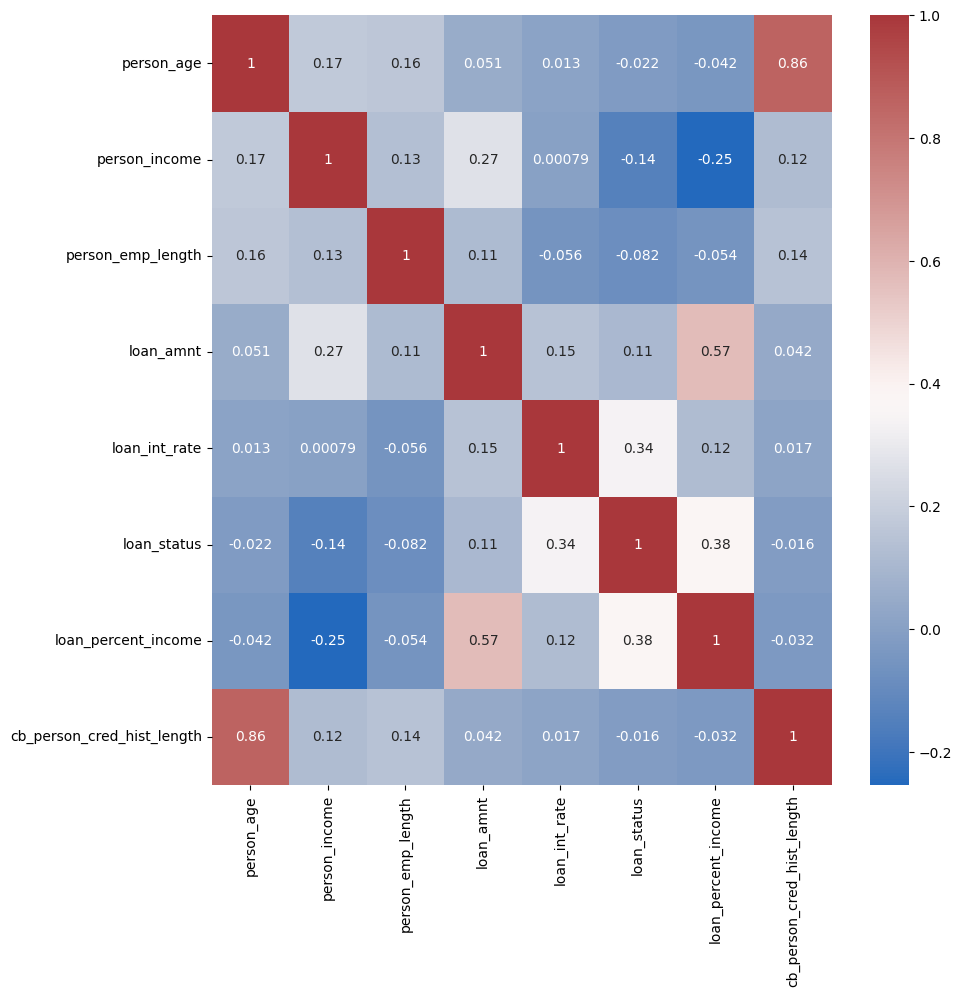

In [ ]:
#visualizzo nel plot la matrice di correlazione
plt.figure(figsize=(10, 10))
corr_matrix = data.corr()
sns.heatmap(corr_matrix, annot=True, cmap='vlag');

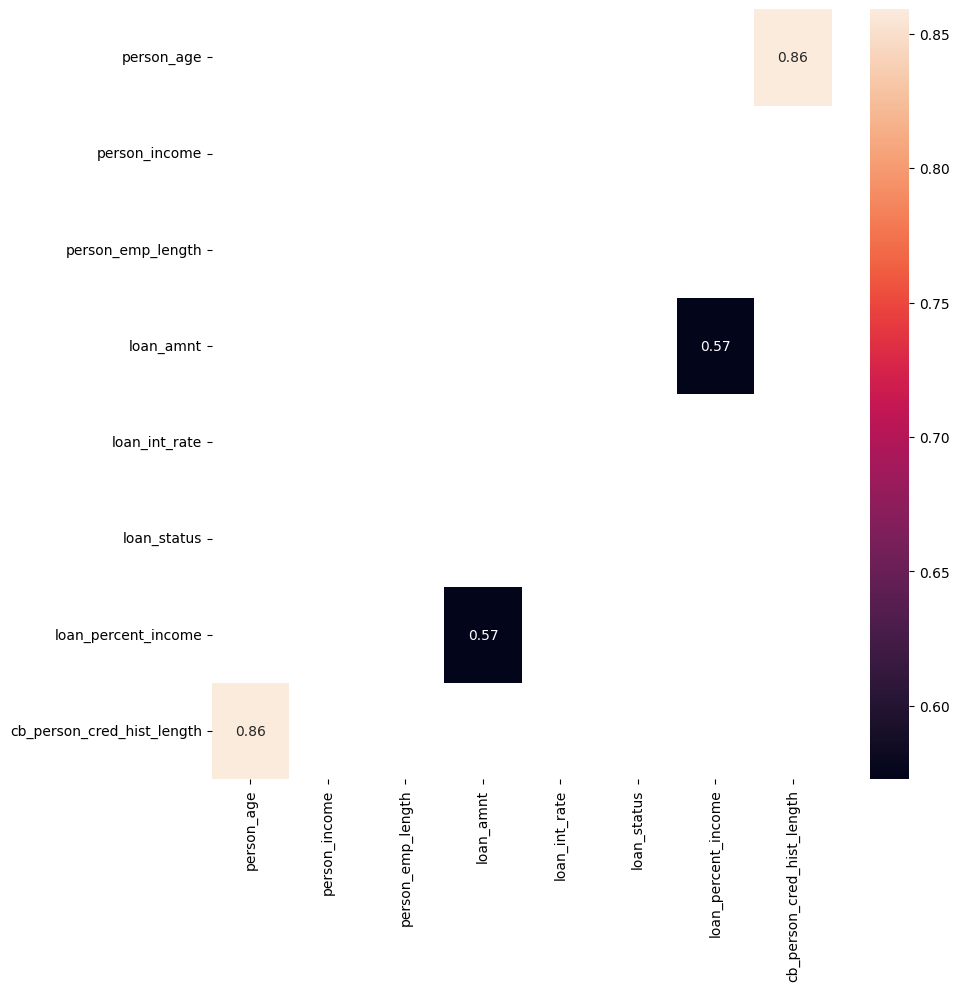

In [ ]:
#isolo i valori di correlazione maggiori di 50%
plt.figure(figsize=(10, 10))
np.fill_diagonal(corr_matrix.values, np.nan)
sns.heatmap(corr_matrix[(corr_matrix.abs()>0.50)], annot=True);

In [ ]:
#valuto la correlazione non lineare tra le variabili numeriche ovvero Spearman
spearman=data.corr(method='spearman')
print(spearman)

                            person_age  person_income  person_emp_length  \
person_age                    1.000000       0.144972           0.107211   
person_income                 0.144972       1.000000           0.213347   
person_emp_length             0.107211       0.213347           1.000000   
loan_amnt                     0.064382       0.406586           0.110051   
loan_int_rate                 0.012246      -0.034283          -0.066426   
loan_status                  -0.033354      -0.272131          -0.097558   
loan_percent_income          -0.057991      -0.366881          -0.058310   
cb_person_cred_hist_length    0.805512       0.091865           0.069790   

                            loan_amnt  loan_int_rate  loan_status  \
person_age                   0.064382       0.012246    -0.033354   
person_income                0.406586      -0.034283    -0.272131   
person_emp_length            0.110051      -0.066426    -0.097558   
loan_amnt                    1.000000  

In [ ]:
#controllo i duplicati
duplicati = data.duplicated()
duplicati.value_counts()

False    32416
True       165
dtype: int64

__Prime considerazioni post Data Exploration:__

-ci sono già degli outlier sull'età delle persone e sugli anni di lavoro per cui imposto un limite

-elevate correlazioni (superiori al 50%) tra le seguenti coppie di variabili: *cb_person_cred_hist_lenght vs person_age*; *loan_percent_income vs loan_amnt*. Da valutare in modo approfondito in sede di visualizzazione.
In prima battuta direi che la "storia" del default non è particolarmente rilevante in quanto una controparte può entrare in default e successivamente tornare in bonis ma questo sarà da valutare durante la data visualization.

-non elimino completamente i record in cui troviamo missing perché perderei le informazioni.

# __2) DATA CLEANING__

In [26]:
#sostituisco con 0 chi non ha anni di lavoro valorizzato
data['person_emp_length'] = data['person_emp_length'].fillna(0)

In [27]:
#sostituisco con valore medio il tasso di interesse nullo e missing
data['loan_int_rate']=data['loan_int_rate'].fillna(np.mean(data['loan_int_rate']))

In [28]:
#verifico di nuovo le info sulle variabili del dataset
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32581 entries, 0 to 32580
Data columns (total 12 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   person_age                  32581 non-null  int64  
 1   person_income               32581 non-null  int64  
 2   person_home_ownership       32581 non-null  object 
 3   person_emp_length           32581 non-null  float64
 4   loan_intent                 32581 non-null  object 
 5   loan_grade                  32581 non-null  object 
 6   loan_amnt                   32581 non-null  int64  
 7   loan_int_rate               32581 non-null  float64
 8   loan_status                 32581 non-null  int64  
 9   loan_percent_income         32581 non-null  float64
 10  cb_person_default_on_file   32581 non-null  object 
 11  cb_person_cred_hist_length  32581 non-null  int64  
dtypes: float64(3), int64(5), object(4)
memory usage: 3.0+ MB


In [29]:
#rimuovo gli outlier impostando un limite arbitrario
limite_sup_age=100
limite_sup_emp=42

#filtro il mio dataset per rimuovere gli outlier
data=data[(data['person_age']<=limite_sup_age) & (data['person_emp_length']<=limite_sup_emp)]

#valuto nuovamente le statistiche descrittive sui valori delle variabili per fare un ulteriore check post trattamento outlier e valori missing e nulli
data.describe()

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_cred_hist_length
count,32574.000000,3.257400e+04,32574.000000,32574.000000,32574.000000,32574.000000,32574.000000,32574.000000
mean,27.718426,6.587848e+04,4.650672,9588.018051,11.011544,0.218180,0.170202,5.804108
std,6.204987,5.253194e+04,4.055187,6320.249598,3.081657,0.413017,0.106755,4.053873
min,20.000000,4.000000e+03,0.000000,500.000000,5.420000,0.000000,0.000000,2.000000
25%,23.000000,3.850000e+04,2.000000,5000.000000,8.490000,0.000000,0.090000,3.000000
50%,26.000000,5.500000e+04,4.000000,8000.000000,11.011695,0.000000,0.150000,4.000000
75%,30.000000,7.920000e+04,7.000000,12200.000000,13.110000,0.000000,0.230000,8.000000
max,94.000000,2.039784e+06,41.000000,35000.000000,23.220000,1.000000,0.830000,30.000000


# __3) DATA VISUALIZATION PRELIMINARE__

In [ ]:
#visualizzo le statistiche sulla variabile target
data["loan_status"].describe()

count    32574.000000
mean         0.218180
std          0.413017
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: loan_status, dtype: float64

<Axes: xlabel='loan_status', ylabel='count'>

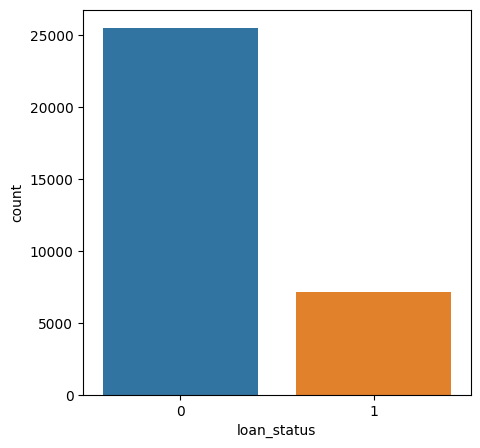

In [ ]:
#analisi di distribuzione delle categorie rispetto alla variabile target
data.groupby(['loan_status']).size()/data.shape[0]
plt.figure(figsize=(5,5))
sns.countplot(x=data["loan_status"])

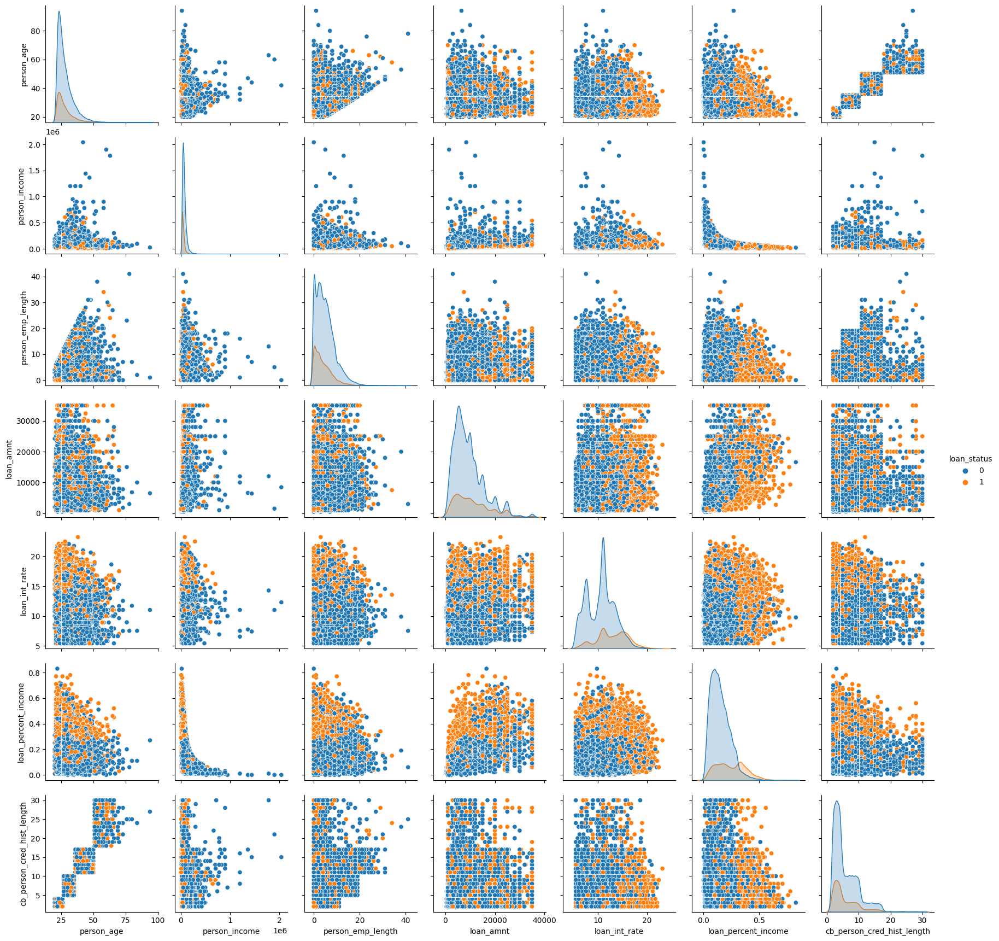

In [ ]:
#analisi della relazione tra tutte le possibili coppie di variabili rispetto al valore assunto dalla var. target
sns.pairplot(data,hue='loan_status')

Da qui posso iniziare ad avere già un'idea delle possibili relazioni/tendenze ponendo l'attenzione sul comportamento/relazione che le variabili assumono rispetto alla variabile target __loan_status__.

Dal momento che è più grave il default, vorrei capire con un po' di visualizzazioni preliminari come varia il flag del default confrontandolo con il resto delle variabili.

La data visualization a mio avviso potrebbe inziare dalle varabili che hanno una correlazione molto elevata. Si precisa che il rapporto tra LOAN_AMNT/PERSON_INCOME equivale a LOAN_PERCENT_INCOME quindi per questo sono strettamente correlte tra loro queste due variabili.

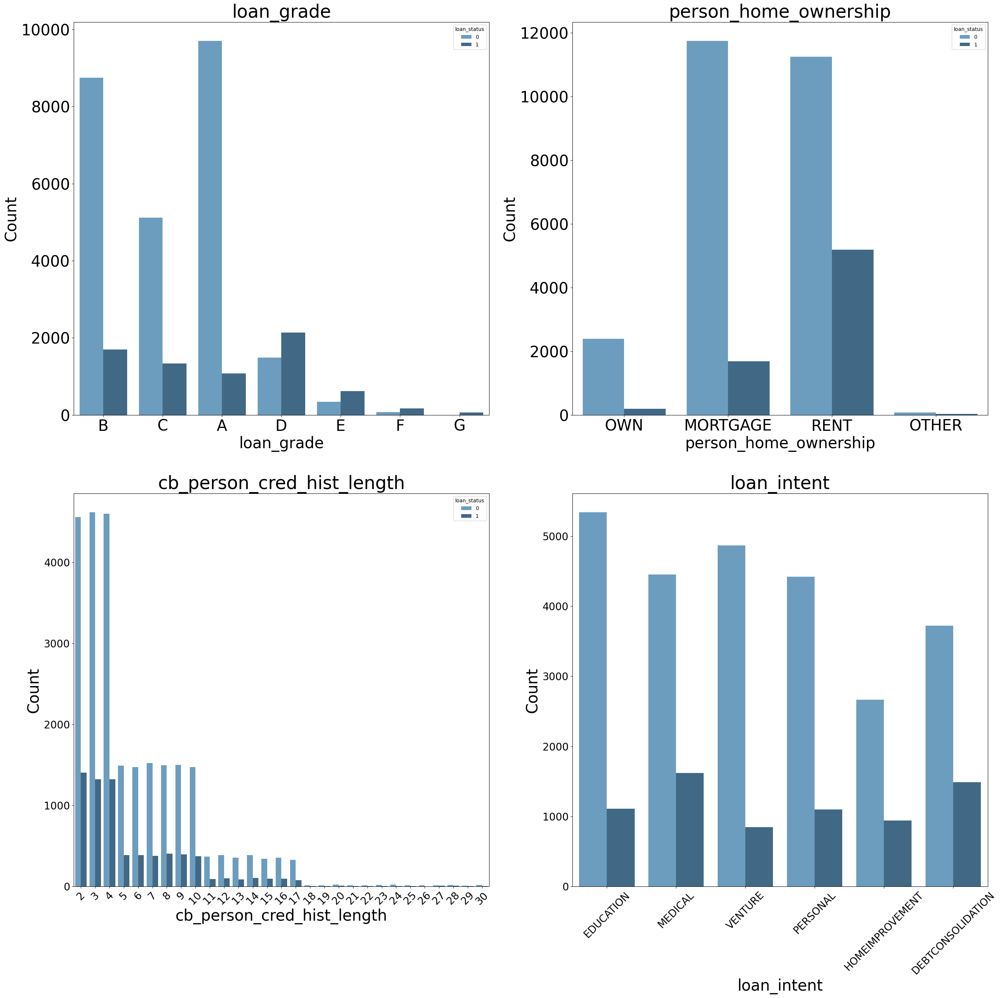

In [ ]:
#Visualizzazione delle singole variabili rispetto al flag dello stato di default
plt.subplot(2,2,1)
cp3 = sns.countplot(x = data['loan_grade'], hue = data['loan_status'], palette = 'Blues_d')
plt.title('loan_grade', fontsize=35)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
cp3.set_xlabel('loan_grade', fontsize=30)
cp3.set_ylabel('Count', fontsize=30)

plt.subplot(2,2,2)
cp4 = sns.countplot(x = data['person_home_ownership'], hue = data['loan_status'], palette = 'Blues_d')
plt.title('person_home_ownership', fontsize=35)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
cp4.set_xlabel('person_home_ownership', fontsize=30)
cp4.set_ylabel('Count', fontsize=30)

plt.subplot(2,2,3)
cp4 = sns.countplot(x = data['cb_person_cred_hist_length'], hue = data['loan_status'], palette = 'Blues_d')
plt.title('cb_person_cred_hist_length', fontsize=35)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xticks(rotation=45)
cp4.set_xlabel('cb_person_cred_hist_length', fontsize=30)
cp4.set_ylabel('Count', fontsize=30)

plt.subplot(2,2,4)
plt.subplots_adjust(right=4, top=5)
cp2 = sns.countplot(x = data['loan_intent'], hue = data['loan_status'], palette = 'Blues_d')
plt.title('loan_intent', fontsize=35)
plt.xticks(rotation=45)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
cp2.set_xlabel('loan_intent', fontsize=30)
cp2.set_ylabel('Count', fontsize=30)
cp2.legend_.remove()

plt.show()

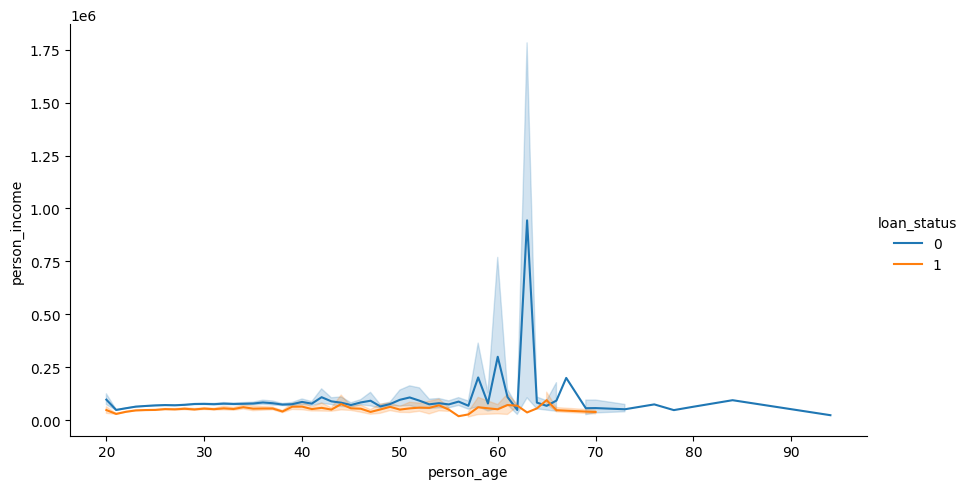

In [ ]:
#relazione tra due variabili e rispetto alla variabile target
sns.relplot(x="person_age", y="person_income",
            hue="loan_status" , aspect=16/9,
            kind="line", data=data);

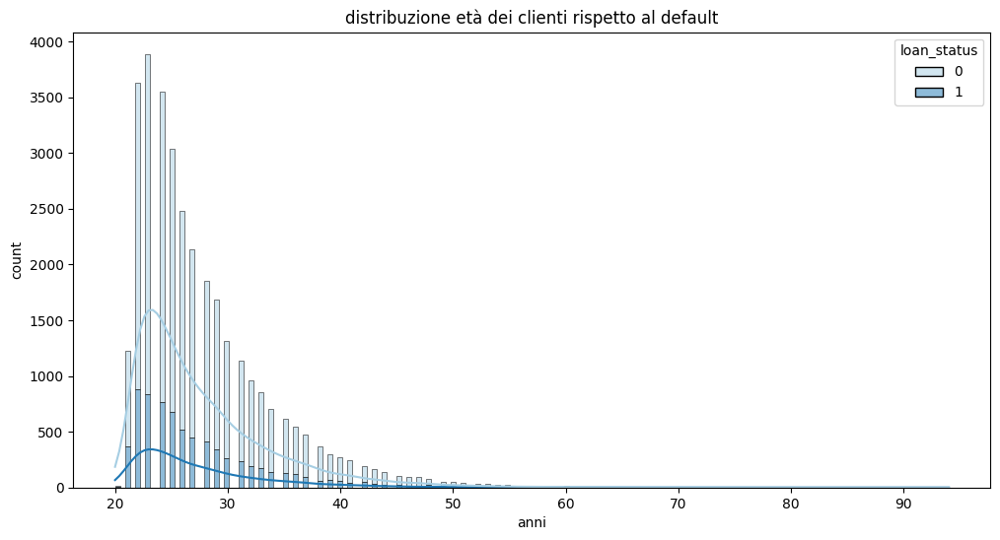

In [ ]:
#la uso perché così è molto più chiaro visivamente, in automatico i colori sono impostati ma paired è a coppie di due e funziona tra due variabili
sns.set_palette('Paired')

#andamento dell'età dei clienti rispetto al default
plt.figure(figsize = (12,6))
sns.histplot(data=data, x='person_age', hue='loan_status', multiple='stack', kde=True)
plt.title('distribuzione età dei clienti rispetto al default')
plt.xlabel('anni')
plt.ylabel('count')
plt.show()

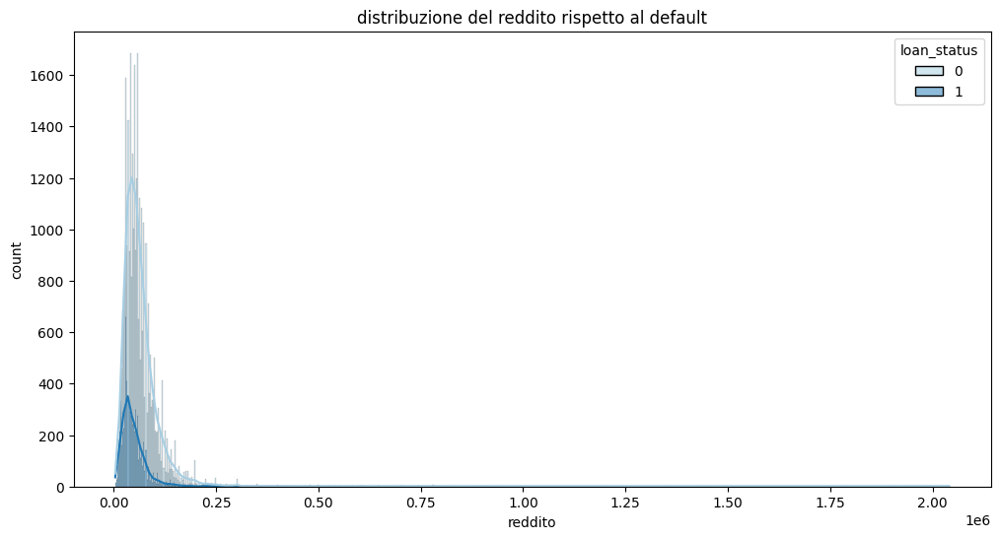

In [ ]:
#distribuzione del reddito dei clienti rispetto al default
plt.figure(figsize = (12,6))
sns.histplot(data=data, x='person_income', hue='loan_status', multiple='stack', kde=True)
plt.title('distribuzione del reddito rispetto al default')
plt.xlabel('reddito')
plt.ylabel('count')
plt.show()

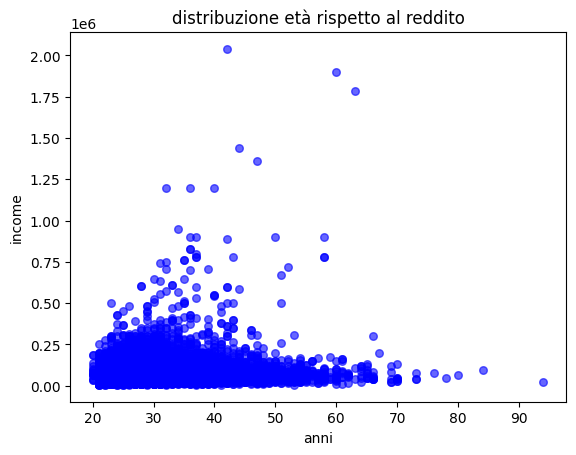

In [ ]:
#distribuzione dell'età delle controparti rispetto al default
x=data['person_age']
y=data['person_income']
plt.scatter(x, y, s=30, c='blue', alpha=0.6)#dimensione dei punti, colore e trasparenza
plt.xlabel('anni')
plt.ylabel('income')
plt.title('distribuzione età rispetto al reddito')
plt.show()

Da questa prima visualization possiamo dedurre che ad una *maggior probabilità di default* corrisponde:

a) un rapporto debito/reddito più elevato

b) i giovani (20-40 anni) che hanno un reddito inferiore sono quelli che rischiano maggiormente il default

c) prestiti con grade D, E, F, G che sono più rischiosi rispetto a quelli di grado A, B, C

d) maggior numero di prestiti relativi a prodotti come Mutuo e affitti

e) rischio più elevato per i giovani con meno anni di esperienza lavorativa

f) le motivazioni più frequenti del prestito: EDUCATION MEDICAL DEBTCONSOLIDATION

# __4) CREAZIONE DI NUOVE VARIABILI__

In [30]:
#Fasce di età ovvero intervalli in cui vengono raggruppati gli anni di età delle persone
max_age=data['person_age'].max()
data['age_group'] = pd.cut(data['person_age'],
                           bins=[20, 30, 41, 51, 61, 62, max_age],
                           labels=['20-30', '31-41', '42-51', '52-61', '62+', str(max_age)])
data.info()
max_age
val_unici_age=data['person_age'].unique()
val_unici_age

<class 'pandas.core.frame.DataFrame'>
Int64Index: 32574 entries, 1 to 32580
Data columns (total 13 columns):
 #   Column                      Non-Null Count  Dtype   
---  ------                      --------------  -----   
 0   person_age                  32574 non-null  int64   
 1   person_income               32574 non-null  int64   
 2   person_home_ownership       32574 non-null  object  
 3   person_emp_length           32574 non-null  float64 
 4   loan_intent                 32574 non-null  object  
 5   loan_grade                  32574 non-null  object  
 6   loan_amnt                   32574 non-null  int64   
 7   loan_int_rate               32574 non-null  float64 
 8   loan_status                 32574 non-null  int64   
 9   loan_percent_income         32574 non-null  float64 
 10  cb_person_default_on_file   32574 non-null  object  
 11  cb_person_cred_hist_length  32574 non-null  int64   
 12  age_group                   32559 non-null  category
dtypes: category(1), 

array([21, 25, 23, 24, 26, 22, 20, 32, 34, 29, 33, 28, 35, 31, 27, 30, 36,
       40, 50, 45, 37, 39, 44, 43, 41, 46, 38, 47, 42, 48, 49, 58, 65, 51,
       53, 66, 61, 54, 57, 59, 62, 60, 55, 52, 64, 70, 78, 69, 56, 73, 63,
       94, 80, 84, 76, 67])

In [31]:
#Fasce di reddito ovvero intervalli in cui vengono raggruppati i valori del reddito di una persona
data['income_group'] = pd.cut(data['person_income'],
                              bins=[0, 25000, 50000, 75000, 100000, float('inf')],
                              labels=['low', 'low-middle', 'middle', 'high-middle', 'high'])
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 32574 entries, 1 to 32580
Data columns (total 14 columns):
 #   Column                      Non-Null Count  Dtype   
---  ------                      --------------  -----   
 0   person_age                  32574 non-null  int64   
 1   person_income               32574 non-null  int64   
 2   person_home_ownership       32574 non-null  object  
 3   person_emp_length           32574 non-null  float64 
 4   loan_intent                 32574 non-null  object  
 5   loan_grade                  32574 non-null  object  
 6   loan_amnt                   32574 non-null  int64   
 7   loan_int_rate               32574 non-null  float64 
 8   loan_status                 32574 non-null  int64   
 9   loan_percent_income         32574 non-null  float64 
 10  cb_person_default_on_file   32574 non-null  object  
 11  cb_person_cred_hist_length  32574 non-null  int64   
 12  age_group                   32559 non-null  category
 13  income_group    

In [32]:
#fasce relative all'ammontare dell'accordato della persona
data['amount_group'] = pd.cut(data['loan_amnt'],
                                   bins=[0, 5000, 10000, 15000, float('inf')],
                                   labels=['small', 'medium', 'large', 'very large'])
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 32574 entries, 1 to 32580
Data columns (total 15 columns):
 #   Column                      Non-Null Count  Dtype   
---  ------                      --------------  -----   
 0   person_age                  32574 non-null  int64   
 1   person_income               32574 non-null  int64   
 2   person_home_ownership       32574 non-null  object  
 3   person_emp_length           32574 non-null  float64 
 4   loan_intent                 32574 non-null  object  
 5   loan_grade                  32574 non-null  object  
 6   loan_amnt                   32574 non-null  int64   
 7   loan_int_rate               32574 non-null  float64 
 8   loan_status                 32574 non-null  int64   
 9   loan_percent_income         32574 non-null  float64 
 10  cb_person_default_on_file   32574 non-null  object  
 11  cb_person_cred_hist_length  32574 non-null  int64   
 12  age_group                   32559 non-null  category
 13  income_group    

In [33]:
# rapporto REDDITO/PRESTITO ovvero la capacità del cliente di rimborsare il debito
data['income_loan_ratio'] = data['person_income'] / data['loan_amnt']

# rapporto AGE/REDDITO che rappresenta la stabilità finanziaria di una persona a fronte dell'età
data['age_income_ratio'] =  data['person_age']/ data['person_income']

# costo relativo del prestito rispetto all'importo del prestito
data['int_rate_loan_ratio'] = data['loan_int_rate'] / data['loan_amnt']
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 32574 entries, 1 to 32580
Data columns (total 18 columns):
 #   Column                      Non-Null Count  Dtype   
---  ------                      --------------  -----   
 0   person_age                  32574 non-null  int64   
 1   person_income               32574 non-null  int64   
 2   person_home_ownership       32574 non-null  object  
 3   person_emp_length           32574 non-null  float64 
 4   loan_intent                 32574 non-null  object  
 5   loan_grade                  32574 non-null  object  
 6   loan_amnt                   32574 non-null  int64   
 7   loan_int_rate               32574 non-null  float64 
 8   loan_status                 32574 non-null  int64   
 9   loan_percent_income         32574 non-null  float64 
 10  cb_person_default_on_file   32574 non-null  object  
 11  cb_person_cred_hist_length  32574 non-null  int64   
 12  age_group                   32559 non-null  category
 13  income_group    

In [34]:
#LIMITE DEL CREDITO SULLA BASE DELLE FASCE DEL RAPPORTO DEBITO/REDDITO (LOAN_PERCENT_INCOME)
val_unici_perc=data['loan_percent_income'].unique()
val_unici_perc


array([0.1 , 0.57, 0.53, 0.55, 0.25, 0.45, 0.44, 0.42, 0.16, 0.41, 0.37,
       0.32, 0.3 , 0.06, 0.29, 0.31, 0.22, 0.52, 0.14, 0.49, 0.13, 0.5 ,
       0.35, 0.17, 0.27, 0.33, 0.08, 0.03, 0.21, 0.63, 0.47, 0.4 , 0.07,
       0.38, 0.34, 0.04, 0.23, 0.15, 0.11, 0.43, 0.51, 0.28, 0.26, 0.19,
       0.39, 0.09, 0.05, 0.59, 0.61, 0.18, 0.6 , 0.01, 0.48, 0.12, 0.54,
       0.56, 0.46, 0.36, 0.24, 0.02, 0.2 , 0.72, 0.64, 0.69, 0.77, 0.83,
       0.65, 0.67, 0.58, 0.71, 0.68, 0.7 , 0.66, 0.  , 0.76, 0.62, 0.78])

In [35]:
# Calcolo l'ammontare del debito totale di una persona
data['debt_tot'] = data['person_income'] * data['loan_percent_income']
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 32574 entries, 1 to 32580
Data columns (total 19 columns):
 #   Column                      Non-Null Count  Dtype   
---  ------                      --------------  -----   
 0   person_age                  32574 non-null  int64   
 1   person_income               32574 non-null  int64   
 2   person_home_ownership       32574 non-null  object  
 3   person_emp_length           32574 non-null  float64 
 4   loan_intent                 32574 non-null  object  
 5   loan_grade                  32574 non-null  object  
 6   loan_amnt                   32574 non-null  int64   
 7   loan_int_rate               32574 non-null  float64 
 8   loan_status                 32574 non-null  int64   
 9   loan_percent_income         32574 non-null  float64 
 10  cb_person_default_on_file   32574 non-null  object  
 11  cb_person_cred_hist_length  32574 non-null  int64   
 12  age_group                   32559 non-null  category
 13  income_group    

In [36]:
# Calcolo il Reddito Residuo
data['residual_debt'] = data['person_income'] - data['debt_tot']

# Calcolo il Debito Totale di Tutti i Richiedenti
debito_totale = data['debt_tot'].sum()

# Calcolo la Media del valore percentuale del debito
media_dti = data['residual_debt'].mean()

# Calcola la Percentuale Media del Reddito Destinata al Debito
percentuale_media_reddito_debito = (data['debt_tot'] / data['person_income']).mean()

data.info()

print("Debito Totale di Tutti i Richiedenti:", debito_totale)
print("Media del DTI:", media_dti)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 32574 entries, 1 to 32580
Data columns (total 20 columns):
 #   Column                      Non-Null Count  Dtype   
---  ------                      --------------  -----   
 0   person_age                  32574 non-null  int64   
 1   person_income               32574 non-null  int64   
 2   person_home_ownership       32574 non-null  object  
 3   person_emp_length           32574 non-null  float64 
 4   loan_intent                 32574 non-null  object  
 5   loan_grade                  32574 non-null  object  
 6   loan_amnt                   32574 non-null  int64   
 7   loan_int_rate               32574 non-null  float64 
 8   loan_status                 32574 non-null  int64   
 9   loan_percent_income         32574 non-null  float64 
 10  cb_person_default_on_file   32574 non-null  object  
 11  cb_person_cred_hist_length  32574 non-null  int64   
 12  age_group                   32559 non-null  category
 13  income_group    

# __5) data visualization__

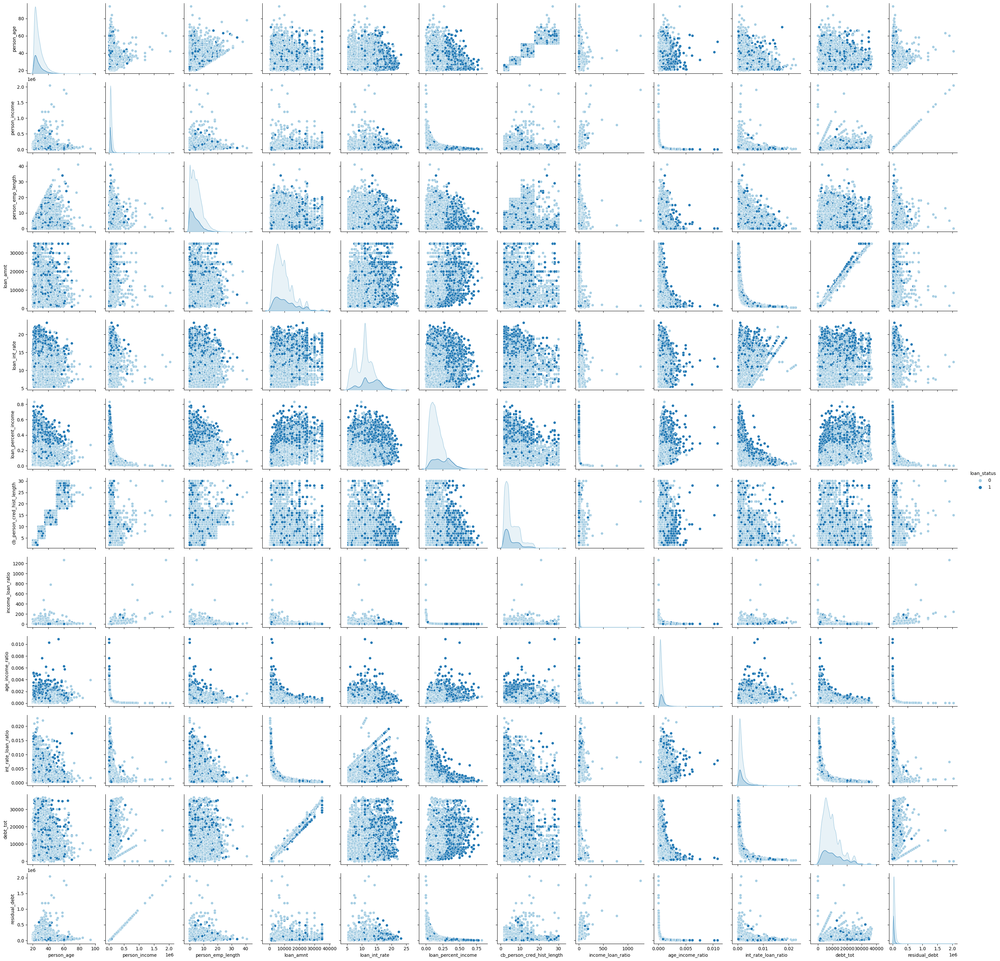

In [ ]:
#provo a plottare tenendo tutte le variabili comprese quelle nuove create valutando la tendenza che hanno rispetto al default
sns.pairplot(data,hue='loan_status')

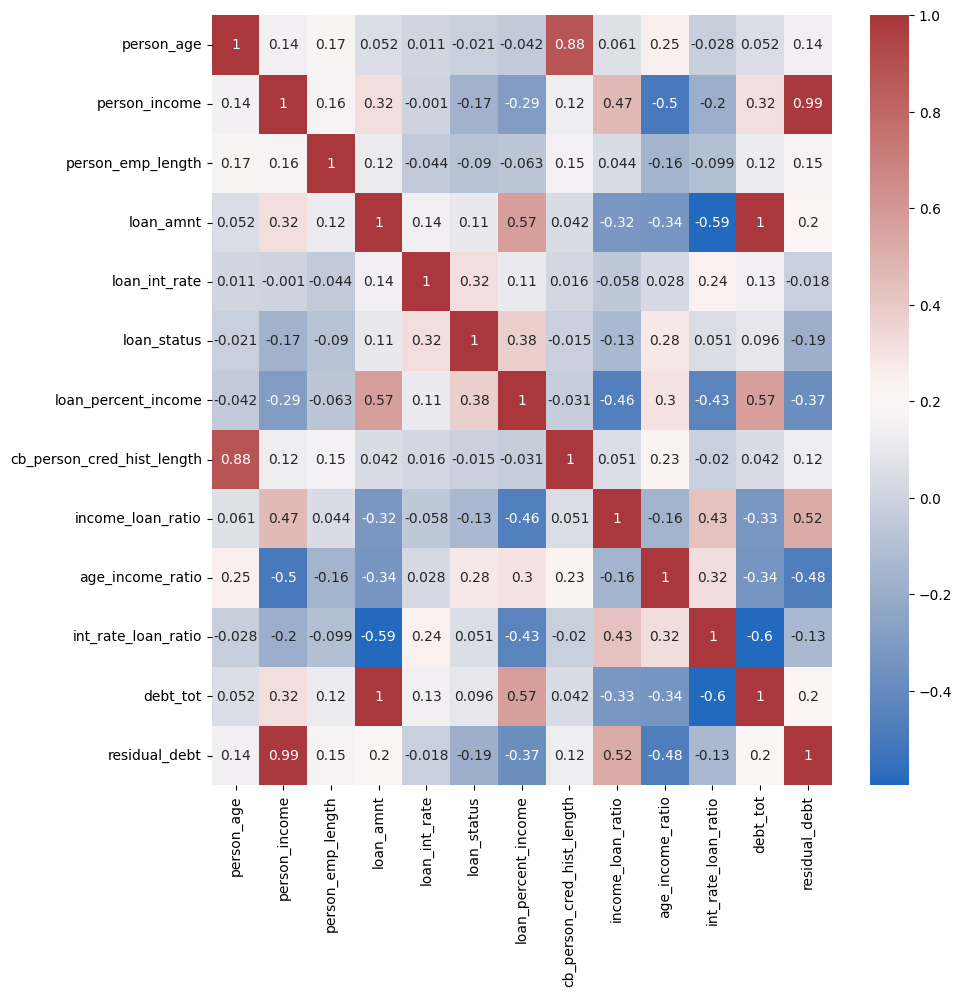

In [ ]:
#valutazione della correlazione anche se mi aspetto valori elevati tra le variabili che concorrono con il calcolo di quelle nuove
plt.figure(figsize=(10, 10))
corr_matrix = data.corr()
sns.heatmap(corr_matrix, annot=True, cmap='vlag');

Text(0, 0.5, 'Debito Totale')

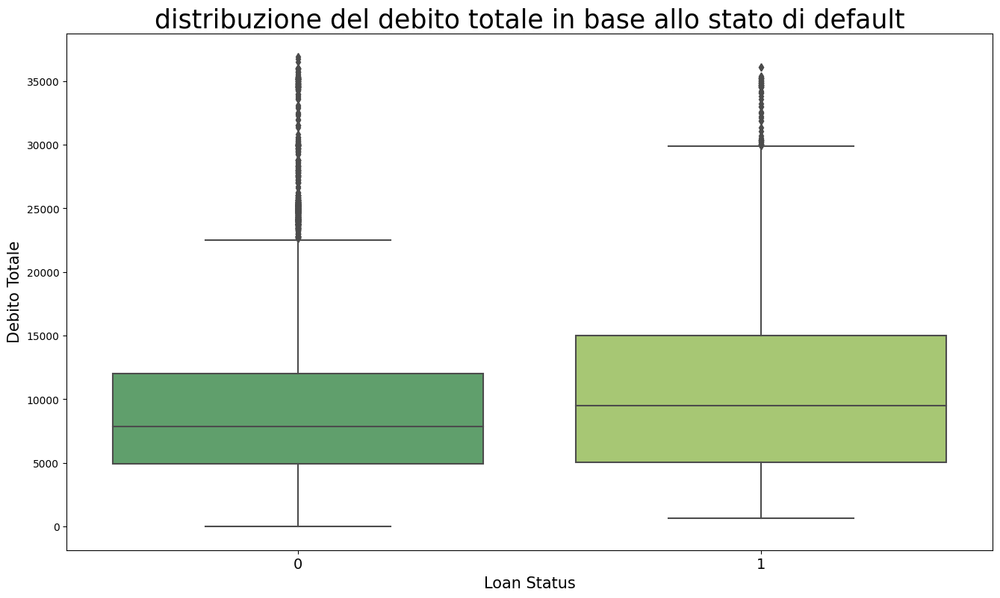

In [ ]:
#distribuzione del debito totale in base allo stato di default
x = data[["loan_status", "debt_tot"]]

f, ax = plt.subplots(figsize=(16, 9));
sns.boxplot(x = "loan_status", y = "debt_tot", data = x, palette = 'summer');

plt.title('distribuzione del debito totale in base allo stato di default', fontsize = 25)
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 10);
plt.xlabel("Loan Status", fontsize = 15)
plt.ylabel("Debito Totale", fontsize = 15)

Text(0, 0.5, 'debito residuo')

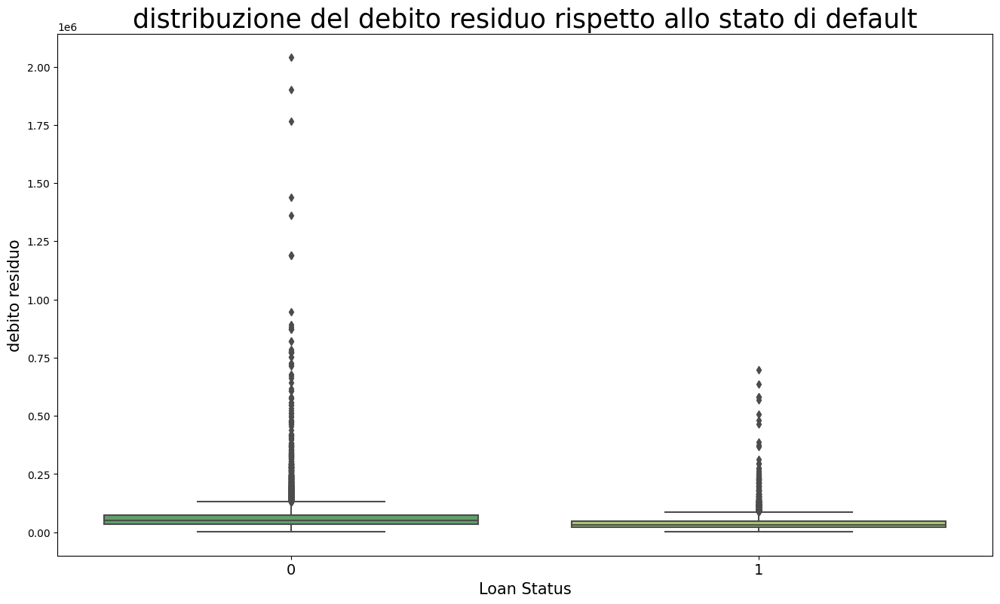

In [ ]:
#distribuzione del debito residuo rispetto allo stato di default
x = data[["loan_status", "residual_debt"]]

f, ax = plt.subplots(figsize=(16, 9));
sns.boxplot(x = "loan_status", y = "residual_debt", data = x, palette = 'summer');

plt.title('distribuzione del debito residuo rispetto allo stato di default', fontsize = 25)
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 10);
plt.xlabel("Loan Status", fontsize = 15)
plt.ylabel("debito residuo", fontsize = 15)

In [ ]:
#grafico a torta con percentuali di tutti i gruppi di età
import plotly.express as ex
ex.pie(data,names='age_group',title='Gruppi di età',hole=0.33)

In [ ]:
#grafico a torta con percentuali di tutti i gruppi di reddito
ex.pie(data,names='income_group',title='Gruppi di reddito',hole=0.33)


In [ ]:
#grafico a torta con percentuali di tutti i gruppi dell'ammontar dell'accordato (o debito)
ex.pie(data,names='amount_group',title='Gruppi di debito (o accordato)',hole=0.33)

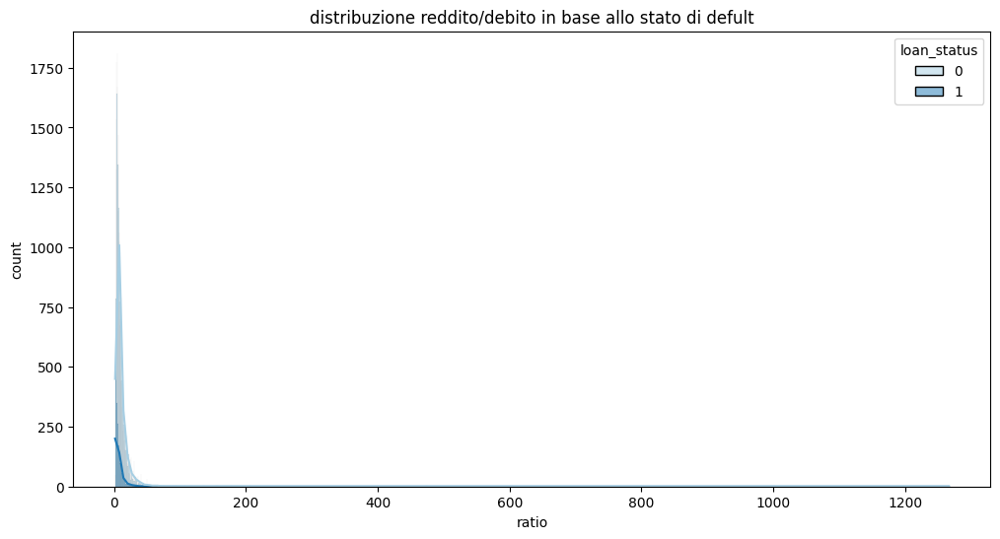

In [ ]:
#distribuzione reddito debito in base allo stato di defult
sns.set_palette('Paired')

plt.figure(figsize = (12,6))
sns.histplot(data=data, x='income_loan_ratio', hue='loan_status', multiple='stack', kde=True)
plt.title('distribuzione reddito/debito in base allo stato di defult')
plt.xlabel('ratio')
plt.ylabel('count')
plt.show()

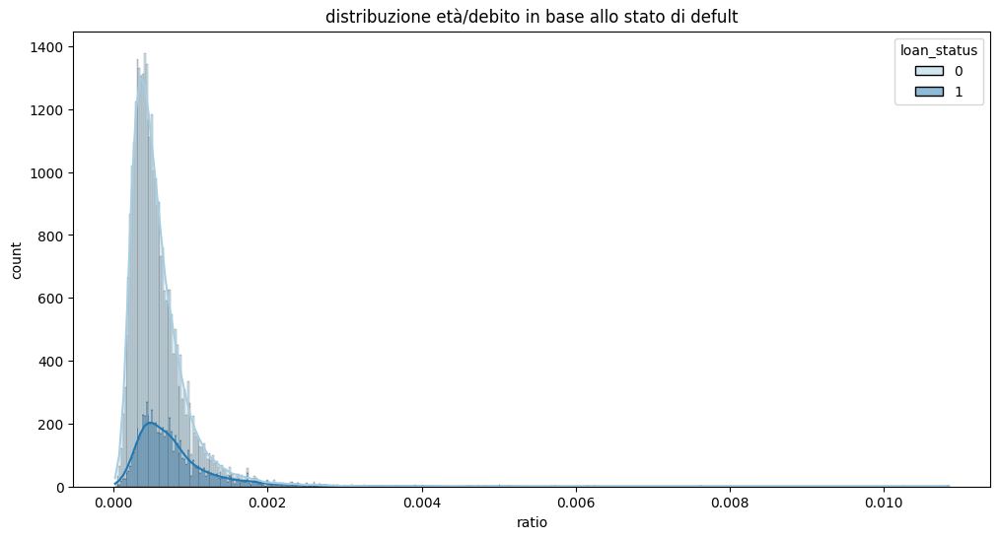

In [ ]:
#distribuzione età/debito in base allo stato di defult
sns.set_palette('Paired')

plt.figure(figsize = (12,6))
sns.histplot(data=data, x='age_income_ratio', hue='loan_status', multiple='stack', kde=True)
plt.title('distribuzione età/debito in base allo stato di defult')
plt.xlabel('ratio')
plt.ylabel('count')
plt.show()

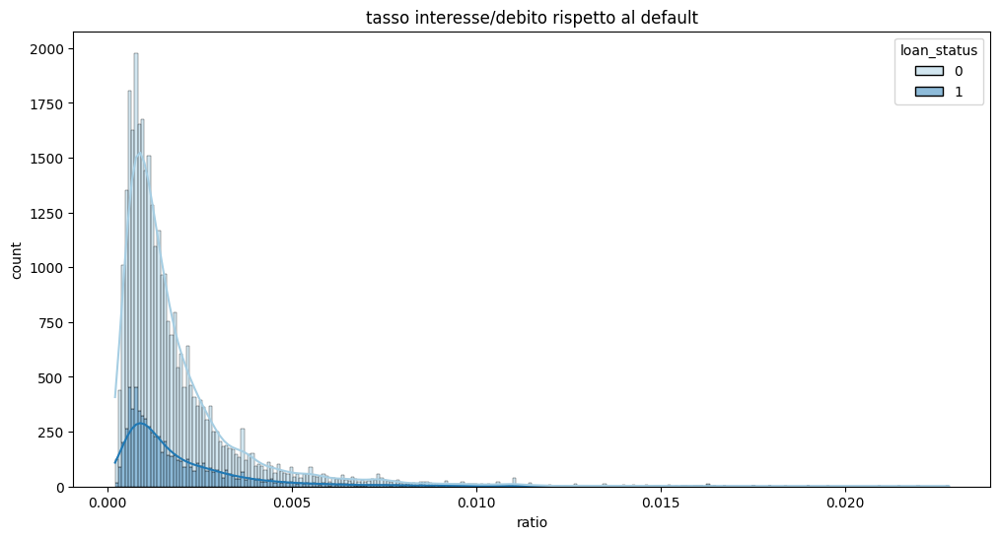

In [ ]:
#la uso perché così è molto più chiaro visivamente, in automatico i colori sono impostati ma paired è a coppie di due e funziona tra due variabili
sns.set_palette('Paired')

#distribuzione tasso interesse/debito rispetto al default
plt.figure(figsize = (12,6))
sns.histplot(data=data, x='int_rate_loan_ratio', hue='loan_status', multiple='stack', kde=True)
plt.title('tasso interesse/debito rispetto al default')
plt.xlabel('ratio')
plt.ylabel('count')
plt.show()

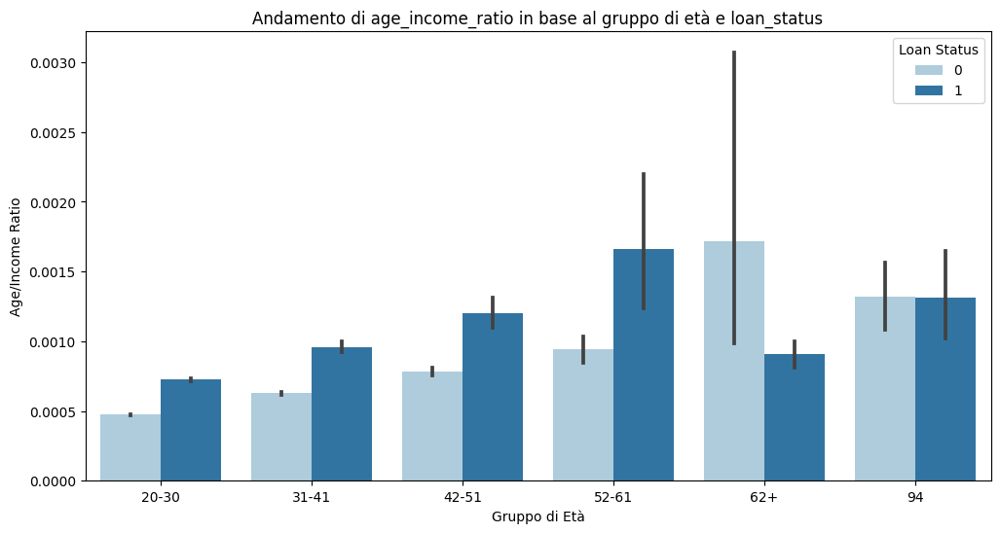

In [ ]:
# Andamento di age_income_ratio in base al gruppo di età e loan_status
plt.figure(figsize=(12, 6))
sns.barplot(data=data, x='age_group', y='age_income_ratio', hue='loan_status')
plt.title('Andamento di age_income_ratio in base al gruppo di età e loan_status')
plt.xlabel('Gruppo di Età')
plt.ylabel('Age/Income Ratio')
plt.legend(title='Loan Status')
plt.show()

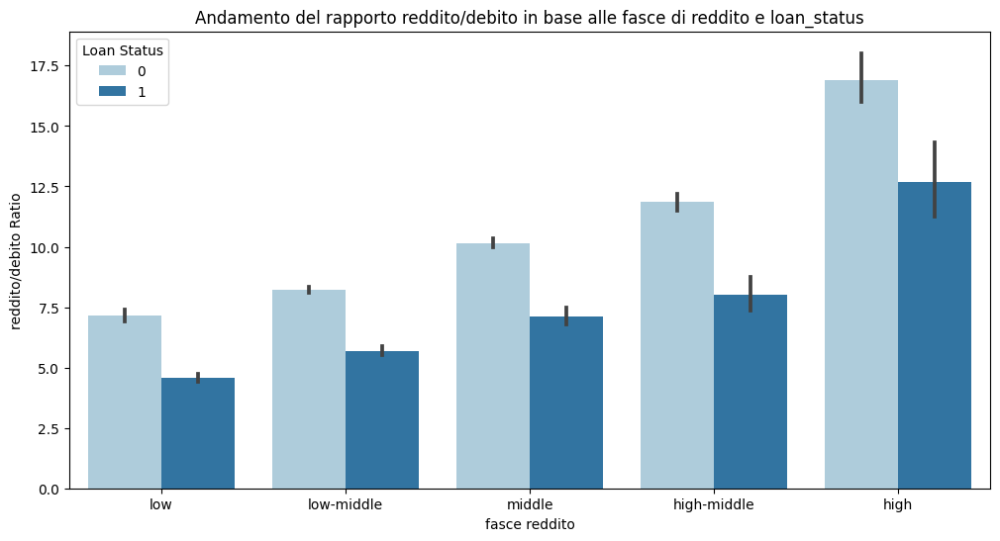

In [ ]:
# Andamento del rapporto reddito/debito in base alle fasce di reddito e loan_status
plt.figure(figsize=(12, 6))
sns.barplot(data=data, x='income_group', y='income_loan_ratio', hue='loan_status')
plt.title('Andamento del rapporto reddito/debito in base alle fasce di reddito e loan_status')
plt.xlabel('fasce reddito')
plt.ylabel('reddito/debito Ratio')
plt.legend(title='Loan Status')
plt.show()

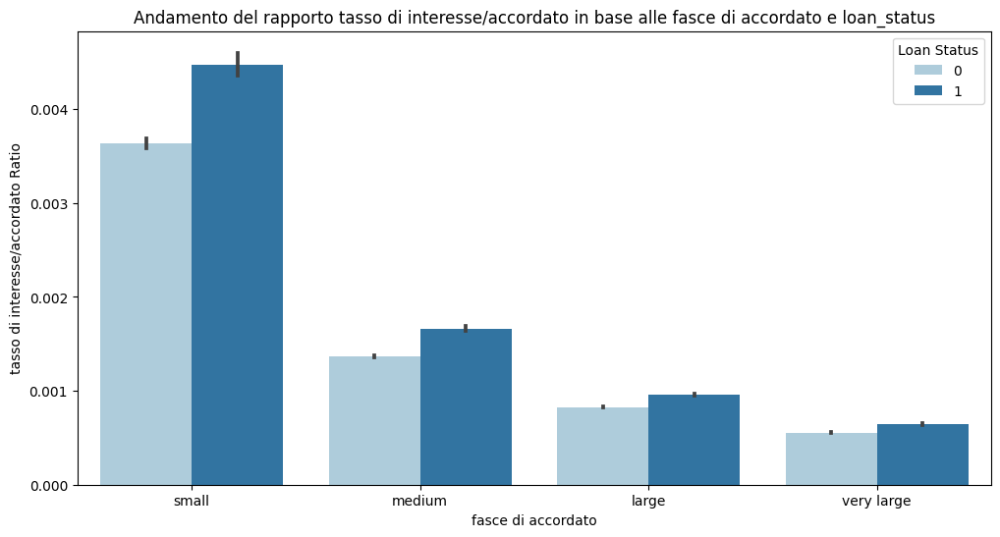

In [ ]:
# Andamento del rapporto tasso di interesse/accordato in base alle fasce di accordato e loan_status
plt.figure(figsize=(12, 6))
sns.barplot(data=data, x='amount_group', y='int_rate_loan_ratio', hue='loan_status')
plt.title('Andamento del rapporto tasso di interesse/accordato in base alle fasce di accordato e loan_status')
plt.xlabel('fasce di accordato')
plt.ylabel('tasso di interesse/accordato Ratio')
plt.legend(title='Loan Status')
plt.show()

__considerazioni post data visualization ed analysis sulle variabili create__

a) all'aumentare del debito toale di un richiedente aumenta anche la sua probabilità di default

b) minore è il debito residuo maggiore è il rischio di default

c) maggiore è il reddito di una persona e minore è il rischio di default

d) le persone meno giovani hanno maggiore reddito, maggiore stabilità finanziaria

e) all'aumentare del rapporto loan_int_rate/loan_amnt aumenta il rischio di default

f) il 76% circa delle controparti appartiene alla fascia di età giovanile 20-30 anni ed il 20% circa alla fascia 31-41 anni

g)il 36% delle controparti ha reddito compreso nella fascia low-middle (fino a 50000) e middle (fino a 75000)

h) 37% delle ctp ha un ammontare del prestito nella fascia medium (fino a 10000) ed il 30% circa nella fascia small (fino a 5000)

# __6) PRE PROCESSING__

In [37]:
#dataset separato in feautures X e y ovvero la variabile target
X = data.drop(['loan_status'], axis=1)
y = data['loan_status']

print(X.shape, y.shape)

(32574, 19) (32574,)


In [38]:
#identifico la y
np.unique(data['loan_status'])

array([0, 1])

In [39]:
data.copy().pop('loan_status')

1        0
2        1
3        1
4        1
5        1
        ..
32576    0
32577    0
32578    1
32579    0
32580    0
Name: loan_status, Length: 32574, dtype: int64

In [40]:
y = data.pop('loan_status')

y = y.values.squeeze()

In [41]:
y

array([0, 1, 1, ..., 1, 0, 0])

In [42]:
# controlliamo lo sbilanciamento del dataset al fine di individuare la giusta tecnica di split
np.bincount(y)/len(y)

array([0.78181986, 0.21818014])

In [43]:
#variabili non binarie -> destinate al one hot encoder 6
X_cat_ohe = data[['person_home_ownership', 'loan_intent', 'loan_grade','age_group','income_group','amount_group']]

#variabili binarie -> destinate al label encoder 1
X_cat_le = data[['cb_person_default_on_file']]

#var numeriche 12
X_num = data[['person_age', 'person_income', 'person_emp_length','loan_amnt','loan_int_rate','loan_percent_income','cb_person_cred_hist_length','income_loan_ratio','age_income_ratio','int_rate_loan_ratio','debt_tot','residual_debt']]

In [44]:
col = ['person_home_ownership', 'loan_intent', 'loan_grade','age_group','income_group','amount_group']
X_cat_ohe = pd.get_dummies(X_cat_ohe, columns=col)
X_cat_le = X_cat_le.apply(LabelEncoder().fit_transform)

print(X_cat_ohe.shape, X_cat_le.shape)

(32574, 32) (32574, 1)


In [45]:
#unisco tutte le colonne create
X = pd.concat([X_cat_le, X_cat_ohe, X_num], axis=1)
print(X.shape, y.shape)

(32574, 45) (32574,)


In [46]:
#visualizzo la X ovvero il nuovo db con tutte le colonne
X.head()

,cb_person_default_on_file,person_home_ownership_MORTGAGE,person_home_ownership_OTHER,person_home_ownership_OWN,person_home_ownership_RENT,loan_intent_DEBTCONSOLIDATION,loan_intent_EDUCATION,loan_intent_HOMEIMPROVEMENT,loan_intent_MEDICAL,loan_intent_PERSONAL,...,person_emp_length,loan_amnt,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,income_loan_ratio,age_income_ratio,int_rate_loan_ratio,debt_tot,residual_debt
1,0,0,0,1,0,0,1,0,0,0,...,5.0,1000,11.14,0.10,2,9.600000,0.002188,0.011140,960.0,8640.0
2,0,1,0,0,0,0,0,0,1,0,...,1.0,5500,12.87,0.57,3,1.745455,0.002604,0.002340,5472.0,4128.0
3,0,0,0,0,1,0,0,0,1,0,...,4.0,35000,15.23,0.53,2,1.871429,0.000351,0.000435,34715.0,30785.0
4,1,0,0,0,1,0,0,0,1,0,...,8.0,35000,14.27,0.55,4,1.554286,0.000441,0.000408,29920.0,24480.0
5,0,0,0,1,0,0,0,0,0,0,...,2.0,2500,7.14,0.25,2,3.960000,0.002121,0.002856,2475.0,7425.0


# __7) MODEL IMPLEMENTATION__

In [47]:
#visualizzo tutte le colonne che ho ora nel dataset post OneHot
X.columns

Index(['cb_person_default_on_file', 'person_home_ownership_MORTGAGE',
       'person_home_ownership_OTHER', 'person_home_ownership_OWN',
       'person_home_ownership_RENT', 'loan_intent_DEBTCONSOLIDATION',
       'loan_intent_EDUCATION', 'loan_intent_HOMEIMPROVEMENT',
       'loan_intent_MEDICAL', 'loan_intent_PERSONAL', 'loan_intent_VENTURE',
       'loan_grade_A', 'loan_grade_B', 'loan_grade_C', 'loan_grade_D',
       'loan_grade_E', 'loan_grade_F', 'loan_grade_G', 'age_group_20-30',
       'age_group_31-41', 'age_group_42-51', 'age_group_52-61',
       'age_group_62+', 'age_group_94', 'income_group_low',
       'income_group_low-middle', 'income_group_middle',
       'income_group_high-middle', 'income_group_high', 'amount_group_small',
       'amount_group_medium', 'amount_group_large', 'amount_group_very large',
       'person_age', 'person_income', 'person_emp_length', 'loan_amnt',
       'loan_int_rate', 'loan_percent_income', 'cb_person_cred_hist_length',
       'income_loan_r

In [48]:
X = X.to_numpy()

In [49]:
#Split del dataset in porzioni di train e di test
from  sklearn.model_selection import ShuffleSplit
rnd=12
splitter = ShuffleSplit(test_size = 0.2, n_splits = 1, random_state = rnd)
splitter

ShuffleSplit(n_splits=1, random_state=12, test_size=0.2, train_size=None)

In [50]:
splitter.split(X)

<generator object BaseShuffleSplit.split at 0x7ae8e3e403c0>

In [51]:
train_idx , test_idx =  next(splitter.split(X))

In [52]:
X[train_idx]

array([[0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        2.40285714e-03, 7.15000000e+03, 5.78500000e+04],
       [0.00000000e+00, 1.00000000e+00, 0.00000000e+00, ...,
        1.83166667e-03, 5.99904000e+03, 4.39929600e+04],
       [0.00000000e+00, 1.00000000e+00, 0.00000000e+00, ...,
        9.07333333e-04, 1.50000000e+04, 6.00000000e+04],
       ...,
       [0.00000000e+00, 1.00000000e+00, 0.00000000e+00, ...,
        5.32500000e-04, 1.99500000e+04, 7.50500000e+04],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        8.82666667e-04, 1.49683200e+04, 3.18076800e+04],
       [0.00000000e+00, 1.00000000e+00, 0.00000000e+00, ...,
        5.61250000e-04, 2.40000000e+04, 7.60000000e+04]])

In [53]:
X_train, X_test = X[train_idx], X[test_idx]
y_train, y_test = y[train_idx], y[test_idx]

In [54]:
X_train.shape, X_test.shape

((26059, 45), (6515, 45))

In [55]:
#valuto eventualmente lo sbilanciamento del dataset
np.bincount(y_train)/len(y_train),np.bincount(y_test)/len(y_test)

(array([0.7801911, 0.2198089]), array([0.78833461, 0.21166539]))

In [56]:
#se il dataset è sbilanciato le famiglie di classi splitter da utilizzare sono quelle chiamate Stratified
from sklearn.model_selection import StratifiedShuffleSplit

splitter = StratifiedShuffleSplit(random_state= rnd, test_size = 0.2, n_splits = 1)

train_idx , test_idx =  next(splitter.split(X,y))

X_train, X_test = X[train_idx], X[test_idx]
y_train, y_test = y[train_idx], y[test_idx]

X_train.shape, X_test.shape

((26059, 45), (6515, 45))

In [57]:
np.bincount(y_train)/len(y_train),np.bincount(y_test)/len(y_test)

(array([0.78180283, 0.21819717]), array([0.78188795, 0.21811205]))

In [58]:
#creazione del validation set
splitter = StratifiedShuffleSplit(random_state= rnd, test_size = 0.2, n_splits = 1)

train_idx, val_idx = next(splitter.split(X_train,y_train))

X_val, y_val = X_train[val_idx], y_train[val_idx]
X_train, y_train = X_train[train_idx], y_train[train_idx]

X_train.shape, X_val.shape, X_test.shape

((20847, 45), (5212, 45), (6515, 45))

__conclusa la suddivisione train test validation, scaliamo le var numeriche__

In [59]:
#MinMaxScaler in modo tale che anche le variabili numeriche appartengano all'intervello [0, 1]
coln = ['cb_person_default_on_file', 'person_home_ownership_MORTGAGE',
       'person_home_ownership_OTHER', 'person_home_ownership_OWN',
       'person_home_ownership_RENT', 'loan_intent_DEBTCONSOLIDATION',
       'loan_intent_EDUCATION', 'loan_intent_HOMEIMPROVEMENT',
       'loan_intent_MEDICAL', 'loan_intent_PERSONAL', 'loan_intent_VENTURE',
       'loan_grade_A', 'loan_grade_B', 'loan_grade_C', 'loan_grade_D',
       'loan_grade_E', 'loan_grade_F', 'loan_grade_G', 'age_group_20-30',
       'age_group_31-41', 'age_group_42-51', 'age_group_52-61',
       'age_group_62+', 'age_group_94', 'income_group_low',
       'income_group_low-middle', 'income_group_middle',
       'income_group_high-middle', 'income_group_high', 'amount_group_small',
       'amount_group_medium', 'amount_group_large', 'amount_group_very large',
       'person_age', 'person_income', 'person_emp_length', 'loan_amnt',
       'loan_int_rate', 'loan_percent_income', 'cb_person_cred_hist_length',
       'income_loan_ratio', 'age_income_ratio', 'int_rate_loan_ratio',
       'debt_tot', 'residual_debt']

mms = MinMaxScaler()

X_train_mms = mms.fit_transform(X_train)
X_train_mms = pd.DataFrame(X_train_mms, columns=coln)

X_test_mms = mms.transform(X_test)
X_test_mms = pd.DataFrame(X_test_mms, columns=coln)

In [60]:
X_train_mms.head()

,cb_person_default_on_file,person_home_ownership_MORTGAGE,person_home_ownership_OTHER,person_home_ownership_OWN,person_home_ownership_RENT,loan_intent_DEBTCONSOLIDATION,loan_intent_EDUCATION,loan_intent_HOMEIMPROVEMENT,loan_intent_MEDICAL,loan_intent_PERSONAL,...,person_emp_length,loan_amnt,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,income_loan_ratio,age_income_ratio,int_rate_loan_ratio,debt_tot,residual_debt
0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0.058824,0.130435,0.428488,0.132530,0.178571,0.006160,0.105279,0.107513,0.134146,0.018480
1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.147059,0.217391,0.144197,0.132530,0.071429,0.005962,0.058893,0.035985,0.208672,0.029400
2,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.088235,0.188406,0.306565,0.192771,0.285714,0.003979,0.104563,0.060565,0.189398,0.016831
3,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.058824,0.036232,0.327766,0.180723,0.035714,0.004467,0.346375,0.279179,0.048780,0.003828
4,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0.176471,0.159420,0.494138,0.216867,0.071429,0.003394,0.113056,0.096623,0.160976,0.012104


In [61]:
X_test_mms.head()

,cb_person_default_on_file,person_home_ownership_MORTGAGE,person_home_ownership_OTHER,person_home_ownership_OWN,person_home_ownership_RENT,loan_intent_DEBTCONSOLIDATION,loan_intent_EDUCATION,loan_intent_HOMEIMPROVEMENT,loan_intent_MEDICAL,loan_intent_PERSONAL,...,person_emp_length,loan_amnt,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,income_loan_ratio,age_income_ratio,int_rate_loan_ratio,debt_tot,residual_debt
0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.088235,0.420290,0.224502,0.301205,0.285714,0.002267,0.085174,0.019108,0.413984,0.021316
1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.029412,0.086957,0.312427,0.072289,0.035714,0.010811,0.073644,0.131589,0.084719,0.022861
2,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.323529,0.217391,0.092028,0.096386,0.178571,0.008926,0.050643,0.030888,0.216802,0.043978
3,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.147059,0.217391,0.559203,0.325301,0.464286,0.002011,0.241381,0.076538,0.219512,0.009571
4,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.235294,0.146377,0.179953,0.084337,0.000000,0.010439,0.048894,0.060946,0.151762,0.035339


In [62]:
X_train_mms.shape, y_train.shape, X_test_mms.shape, y_test.shape

((20847, 45), (20847,), (6515, 45), (6515,))

__feautures selection__

In [63]:
#utilizzo questa tecnica che mi permette di individuare automaticamente le feautures con score più elevato quindi le più adatte per allenare il modello, quelle da tenere nel db
def feature_selection(n_best_ft, Xtr, ytr, Xtest):
    ft = SelectKBest(f_classif, k = n_best_ft).fit(Xtr, ytr)
    scores_df = pd.DataFrame(ft.scores_)
    columns_df = pd.DataFrame(Xtr.columns)
    ft_scores = pd.concat([columns_df, scores_df], axis = 1)
    ft_scores.columns = ['X_feature', 'Score']
    ft_scores = ft_scores.sort_values('Score', ascending = False)
    best_features = ft_scores.head(n_best_ft).reset_index().drop(['index'], axis = 1)
    Xtr_fs = ft.transform(Xtr)
    Xtest_fs = ft.transform(Xtest)
    return best_features, Xtr_fs, Xtest_fs

In [64]:
best_ft, X_train_fs, X_test_fs = feature_selection(9, X_train_mms, y_train, X_test_mms)

In [65]:
best_ft

,X_feature,Score
0,loan_percent_income,3501.201125
1,loan_grade_D,2403.783835
2,loan_int_rate,2284.262993
3,age_income_ratio,1853.713484
4,person_home_ownership_RENT,1226.625276
5,income_group_low,1012.657963
6,loan_grade_A,862.159826
7,person_home_ownership_MORTGAGE,735.742997
8,residual_debt,695.727659


In [66]:
X_train_fs.shape, y_train.shape, X_test_fs.shape, y_test.shape

((20847, 9), (20847,), (6515, 9), (6515,))

Nel dataset le variabili non sono tante e molte sono categoriche quindi già il one hot crea tot colonne (dummies) per ogni valore della variabile per cui andrei a perdere l'info se qualche colonna venisse scartata. Decido quindi di tenerle tutte sia per questo motivo sia perché gli score sono elevati

# __8) Decido di utilizzare queste tipologie di modelli__

__1.Logistic Regression perché anche i modelli di rating interni airb validati stimano la pd così__

__2.KNN Classifier__

__3.Decision Tree Classifier__

__4.Random Forest Classifier and Bagging Classifier__

__5.XGBoost Classifier__

__1. REGRESSIONE LOGISTICA__

In [ ]:
#REGRESSIONE LOGISTICA
log_reg = LogisticRegression(random_state=42)
log_reg.fit(X_train,y_train)
y_pred_log_reg = log_reg.predict(X_test)
print(classification_report(y_test,y_pred_log_reg))
f1_lr = f1_score(y_test, y_pred_log_reg, average='weighted')
print('F1-score average is: %.3f' %(f1_lr))
recall_lr = recall_score(y_test, y_pred_log_reg, pos_label=1, average='binary')
print('Recall score (class 1) is: %.3f' %(recall_lr))

              precision    recall  f1-score   support

           0       0.84      0.96      0.90      5094
           1       0.70      0.35      0.46      1421

    accuracy                           0.82      6515
   macro avg       0.77      0.65      0.68      6515
weighted avg       0.81      0.82      0.80      6515

F1-score average is: 0.801
Recall score (class 1) is: 0.346


In [ ]:
#decido subito, per la regressione logistica di ottimizzare i parametri
par_grid_rl = {'penalty': ['l1', 'l2'],
              'C': np.arange(.1, 5, .1)}
reg_log_opt = LogisticRegression(solver='saga',
                                 max_iter=1000)
reg_log_opt_gs = GridSearchCV(reg_log_opt, par_grid_rl)
reg_log_opt_gs.fit(X_train, y_train)
y_pred_reglog = reg_log_opt_gs.predict(X_val)
print('Best parameters: ', reg_log_opt_gs.best_params_)

Best parameters:  {'C': 0.1, 'penalty': 'l1'}


In [ ]:
#valuto la performance sul test set cambiando i parametri sulla base del risultato della grid
reg_log_final = LogisticRegression(solver='saga', max_iter=1000, C=0.1, penalty='l1')
reg_log_final.fit(np.concatenate([X_train,X_val], axis=0), np.concatenate([y_train,y_val]))
y_pred_test_rl =  reg_log_final.predict(X_test)
f1_score(y_test, y_pred_test_rl)

0.25960419091967407

In [ ]:
#calcolo dell'auc sulla porzione di test e di y pred
auc=roc_auc_score(y_test,y_pred_test_rl)
print (auc)

0.5712024219134874


In [ ]:
#cross validation
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

In [ ]:
# Crea gli oggetti dei modelli
logistic_model = LogisticRegression()
# Eseguo la cross-validation combinata su train e validation per ciascun modello
logistic_scores = cross_val_score(logistic_model, X_train, y_train, cv=5, scoring='accuracy')
# Calcolo la media degli score della cross-validation
logistic_mean_score = logistic_scores.mean()
# Addestro ciascun modello sul set di addestramento completo
logistic_model.fit(X_train, y_train)
# Calcolo gli score sui dati di test
logistic_test_score = accuracy_score(y_test, logistic_model.predict(X_test))
# Stampo gli score ottenuti
print("Regressione Logistica Cross-Validation Score:", logistic_mean_score)
print("Regressione Logistica Test Score:", logistic_test_score)

Regressione Logistica Cross-Validation Score: 0.8238590648229798
Regressione Logistica Test Score: 0.8244052187260169


__2. KNN__

In [ ]:
#addestramento modello e calcolo score
knn = KNeighborsClassifier(n_neighbors=8)
knn.fit(X_train,y_train)
y_pred_knn = knn.predict(X_test)
print(classification_report(y_test,y_pred_knn))
f1_knn =f1_score(y_test, y_pred_knn, average='weighted')
print('F1-score average is: %.3f' %(f1_knn))
recall_knn = recall_score(y_test, y_pred_knn, pos_label=1, average='binary')
print('Recall score (class 1) is: %.3f' %(recall_knn))

              precision    recall  f1-score   support

           0       0.86      0.96      0.90      5094
           1       0.74      0.42      0.54      1421

    accuracy                           0.84      6515
   macro avg       0.80      0.69      0.72      6515
weighted avg       0.83      0.84      0.82      6515

F1-score average is: 0.824
Recall score (class 1) is: 0.419


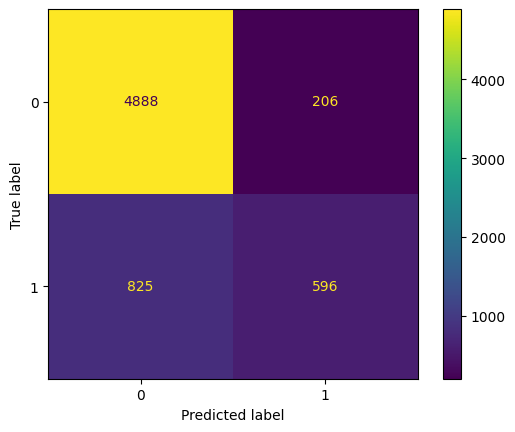

In [ ]:
#Create and plot confusion matrix
confusion_matrix_knn = confusion_matrix(y_test, y_pred_knn)
cm_display_knn = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix_knn, display_labels=['0','1'])
cm_display_knn.plot()
plt.show()

In [ ]:
#decido subito, per il KNN di ottimizzare i parametri
# Definizione del range dei parametri da testare
param_grid = {
    'n_neighbors': [3, 5, 7, 9],  # Diversi valori di k
    'metric': ['euclidean', 'manhattan'],  # Diverse metriche di distanza
    'weights': ['uniform', 'distance']  # Diversi pesi per i vicini
}

# Esecuzione della ricerca sui parametri utilizzando la cross-validation
grid_search = GridSearchCV(knn, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

# Visualizza i migliori parametri trovati
print("Migliori parametri:", grid_search.best_params_)

# Valutazione del modello con i migliori parametri sul set di test
best_knn = grid_search.best_estimator_
accuracy = best_knn.score(X_test, y_test)
print("Accuracy sul set di test:", accuracy)

Migliori parametri: {'metric': 'manhattan', 'n_neighbors': 9, 'weights': 'distance'}
Accuracy sul set di test: 0.8460475825019187


In [ ]:
#valuto la performance sul test set SELEZIONANDO BEST PARAM COME INDICATO SOPRA anche se non cambia di tanto rispettoa 7
knn = KNeighborsClassifier(n_neighbors=7)
knn.fit(X_train,y_train)
y_pred_knn = knn.predict(X_test)
print(classification_report(y_test,y_pred_knn))
f1_knn =f1_score(y_test, y_pred_knn, average='weighted')
print('F1-score average is: %.3f' %(f1_knn))
recall_knn = recall_score(y_test, y_pred_knn, pos_label=1, average='binary')
print('Recall score (class 1) is: %.3f' %(recall_knn))

              precision    recall  f1-score   support

           0       0.86      0.94      0.90      5094
           1       0.70      0.47      0.56      1421

    accuracy                           0.84      6515
   macro avg       0.78      0.71      0.73      6515
weighted avg       0.83      0.84      0.83      6515

F1-score average is: 0.828
Recall score (class 1) is: 0.469


In [ ]:
#cross validation
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_score
from sklearn.neighbors import KNeighborsClassifier
knn_model = KNeighborsClassifier()
knn_scores = cross_val_score(knn_model, X_train, y_train, cv=5, scoring='accuracy')
knn_mean_score = knn_scores.mean()
knn_model.fit(X_train, y_train)
knn_test_score = accuracy_score(y_test, knn_model.predict(X_test))
print("K-Nearest Neighbors Cross-Validation Score:", knn_mean_score)
print("K-Nearest Neighbors Test Score:", knn_test_score)

K-Nearest Neighbors Cross-Validation Score: 0.831630287039258
K-Nearest Neighbors Test Score: 0.8396009209516501


__3. DECISION TREE CLASSIFIER__

In [ ]:
#Decision Tree
dt = DecisionTreeClassifier(max_depth=8, random_state=42)
dt.fit(X_train,y_train)
y_pred_dt = dt.predict(X_test)
print(classification_report(y_test,y_pred_dt))
f1_dt = f1_score(y_test, y_pred_dt, average='weighted')
print('F1 score average is: %.3f' %(f1_dt))
recall_dt = recall_score(y_test, y_pred_dt, pos_label=1, average='binary')
print('Recall score (class 1) is: %.3f' %(recall_dt))

              precision    recall  f1-score   support

           0       0.92      0.99      0.95      5094
           1       0.96      0.69      0.80      1421

    accuracy                           0.93      6515
   macro avg       0.94      0.84      0.88      6515
weighted avg       0.93      0.93      0.92      6515

F1 score average is: 0.921
Recall score (class 1) is: 0.688


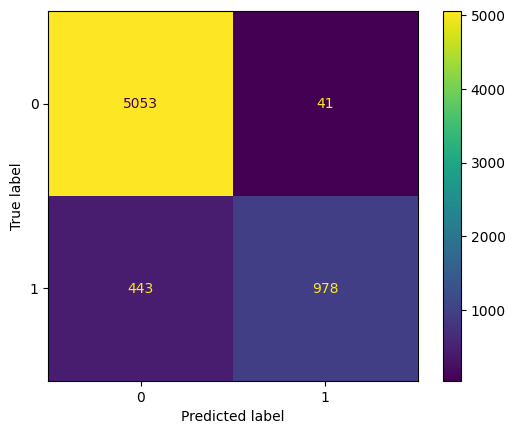

In [ ]:
#Create and plot confusion matrix
confusion_matrix_dt = confusion_matrix(y_test, y_pred_dt)
cm_display_dt = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix_dt, display_labels=['0','1'])
cm_display_dt.plot()
plt.show()

In [ ]:
# Definizione del range dei parametri da testare
dt_classifier = DecisionTreeClassifier()
param_grid = {
    'max_depth': [None, 5, 10, 15],  # Profondità massima dell'albero
    'min_samples_split': [2, 5, 10],  # Numero minimo di campioni per suddividere un nodo
    'min_samples_leaf': [1, 2, 4],  # Numero minimo di campioni in una foglia
    'criterion': ['gini', 'entropy']  # Funzione di criterio
}

# Esecuzione della ricerca sui parametri utilizzando la cross-validation
grid_search = GridSearchCV(dt_classifier, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

# Visualizza i migliori parametri trovati
print("Migliori parametri:", grid_search.best_params_)

# Valutazione del modello con i migliori parametri sul set di test
best_dt_classifier = grid_search.best_estimator_
accuracy = best_dt_classifier.score(X_test, y_test)
print("Accuracy sul set di test:", accuracy)

Migliori parametri: {'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 10}
Accuracy sul set di test: 0.9226400613967767


In [ ]:
#Decision Tree con parametri best dalla grid
dt = DecisionTreeClassifier(max_depth=10, random_state=42)
dt.fit(X_train,y_train)
y_pred_dt = dt.predict(X_test)
print(classification_report(y_test,y_pred_dt))
f1_dt = f1_score(y_test, y_pred_dt, average='weighted')
print('F1 score average is: %.3f' %(f1_dt))
recall_dt = recall_score(y_test, y_pred_dt, pos_label=1, average='binary')
print('Recall score (class 1) is: %.3f' %(recall_dt))

              precision    recall  f1-score   support

           0       0.92      0.99      0.95      5094
           1       0.93      0.70      0.80      1421

    accuracy                           0.92      6515
   macro avg       0.93      0.84      0.87      6515
weighted avg       0.92      0.92      0.92      6515

F1 score average is: 0.918
Recall score (class 1) is: 0.696


__DECISION TREE CLASSIFIER WITH BAGGING__

In [ ]:
#check
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier

bag_clf = BaggingClassifier(
    DecisionTreeClassifier(), n_estimators=500,
    max_samples=100, bootstrap=True, random_state=42)
bag_clf.fit(X_train, y_train)
y_pred = bag_clf.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score
print(accuracy_score(y_test, y_pred))

0.8862624712202609


In [ ]:
tree_clf = DecisionTreeClassifier(random_state=42)
tree_clf.fit(X_train, y_train)
y_pred_tree = tree_clf.predict(X_test)
print(accuracy_score(y_test, y_pred_tree))

0.8877973906369916


In [ ]:
#cross validation
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score

decision_tree_model = DecisionTreeClassifier()

# Specifico il numero di fold per la cross-validation
num_folds = 5  # Ad esempio, 5 fold

# Eseguo la cross-validation combinata su train e validation per ciascun modello
decision_tree_scores = cross_val_score(decision_tree_model, X_train, y_train, cv=num_folds, scoring='accuracy')

# Calcolo la media degli score della cross-validation
decision_tree_mean_score = decision_tree_scores.mean()

# Addestro ciascun modello sul set di addestramento completo
decision_tree_model.fit(X_train, y_train)

# Calcolo gli score sui dati di test
decision_tree_test_score = accuracy_score(y_test, decision_tree_model.predict(X_test))

# Stampo gli score ottenuti

print("Decision Tree Cross-Validation Score:", decision_tree_mean_score)
print("Decision Tree Test Score:", decision_tree_test_score)


Decision Tree Cross-Validation Score: 0.8901999053192083
Decision Tree Test Score: 0.8850345356868764


__4.RANDOM FOREST__

In [43]:
#addestramento del modello
from sklearn.ensemble import RandomForestClassifier

rnd_clf = RandomForestClassifier(n_estimators=500, max_leaf_nodes=16, random_state=42)
rnd_clf.fit(X_train, y_train)

y_pred_rf = rnd_clf.predict(X_test)

In [44]:
bag_clf = BaggingClassifier(
    DecisionTreeClassifier(max_features="sqrt", max_leaf_nodes=16),
    n_estimators=500, random_state=42)

In [45]:
bag_clf.fit(X_train, y_train)
y_pred = bag_clf.predict(X_test)

In [46]:
#confronto previsioni dei due modelli
np.sum(y_pred == y_pred_rf) / len(y_pred)

0.9947812739831159

In [47]:
# ottimizzazione dei parametri della random forest classifier
rf_classifier = RandomForestClassifier(random_state=42)

# Definizione del range dei parametri da testare
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt', 'log2']
}

# Esecuzione della Grid Search utilizzando la cross-validation
grid_search = GridSearchCV(rf_classifier, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

# Visualizza i migliori parametri trovati
print("Migliori parametri:", grid_search.best_params_)

# Valutazione del modello con i migliori parametri sul set di test
best_rf_classifier = grid_search.best_estimator_
accuracy = best_rf_classifier.score(X_test, y_test)
print("Accuracy sul set di test:", accuracy)

Migliori parametri: {'max_depth': None, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
Accuracy sul set di test: 0.9306216423637759


In [61]:
#ripetiamo post ottimizzazione
rnd_clf = RandomForestClassifier(n_estimators=200, min_samples_leaf=1, random_state=42)
rnd_clf.fit(X_train, y_train)
y_pred_rf = rnd_clf.predict(X_test)
bag_clf = BaggingClassifier(
    DecisionTreeClassifier(max_features="auto", min_samples_leaf=1),
    n_estimators=200, random_state=42)
bag_clf.fit(X_train, y_train)
y_pred = bag_clf.predict(X_test)
np.sum(y_pred == y_pred_rf) / len(y_pred)

0.9967766692248657

In [62]:
#cross validation
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import accuracy_score

# Creo gli oggetti dei modelli
random_forest_model = RandomForestClassifier()

# Specifico il numero di fold per la cross-validation
num_folds = 5  # Ad esempio, 5 fold

# Eseguo la cross-validation combinata su train e validation per ciascun modello
random_forest_scores = cross_val_score(random_forest_model, X_train, y_train, cv=num_folds, scoring='accuracy')

# Calcolo la media degli score della cross-validation
random_forest_mean_score = random_forest_scores.mean()

# Addestro ciascun modello sul set di addestramento completo
random_forest_model.fit(X_train, y_train)

# Calcolo gli score sui dati di test
random_forest_test_score = accuracy_score(y_test, random_forest_model.predict(X_test))

# Stampo gli score ottenuti
print("Random Forest Cross-Validation Score:", random_forest_mean_score)
print("Random Forest Test Score:", random_forest_test_score)

Random Forest Cross-Validation Score: 0.9324609388634615
Random Forest Test Score: 0.9303146584804298


__5. XGBOOST CLASSIFIER__

In [67]:
#XGBoost Classifier
xgb = XGBClassifier(random_state=42)
xgb.fit(X_train,y_train)
y_pred_xgb = xgb.predict(X_test)
print(classification_report(y_test,y_pred_xgb))
f1_xgb = f1_score(y_test, y_pred_xgb, average='weighted')
print('F1-score average is: %.3f' %(f1_xgb))
recall_xgb = recall_score(y_test, y_pred_xgb, pos_label=1, average='binary')
print('Recall score (class 1) is: %.3f' %(recall_xgb))

              precision    recall  f1-score   support

           0       0.93      0.99      0.96      5094
           1       0.95      0.73      0.83      1421

    accuracy                           0.93      6515
   macro avg       0.94      0.86      0.89      6515
weighted avg       0.94      0.93      0.93      6515

F1-score average is: 0.931
Recall score (class 1) is: 0.735


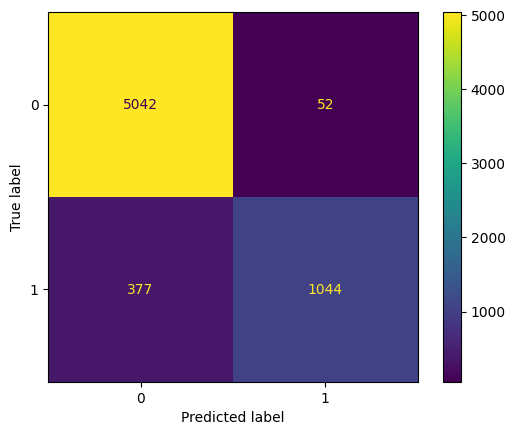

In [68]:
#Create and plot confusion matrix
confusion_matrix_xgb = confusion_matrix(y_test, y_pred_xgb)
cm_display_xgb = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix_xgb, display_labels=['0','1'])
cm_display_xgb.plot()
plt.show()

In [69]:
train_accuracy_xgb = xgb.score(X_train, y_train)
#Compute accuracy on the test set
test_accuracy_xgb = xgb.score(X_test, y_test)

train_accuracy_xgb, test_accuracy_xgb

(0.9648870341056267, 0.9341519570222563)

In [ ]:
#ottimizzazione iperparametri (molto oneroso dal punto di vista computazionale, motivo per il quale non l'ho fatto ri-girare)
import xgboost as xgb
from sklearn.model_selection import GridSearchCV
# Definisci il tuo modello Gradient Boosting Classifier
gb_model = GradientBoostingClassifier()

# Definisci la griglia degli iperparametri da esplorare
param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 4, 5],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'subsample': [0.8, 0.9, 1.0]
}

# Crea un oggetto GridSearchCV per eseguire la ricerca degli iperparametri
grid_search = GridSearchCV(estimator=gb_model, param_grid=param_grid, cv=5, scoring='accuracy')

# Addestra il modello con i dati di addestramento
grid_search.fit(X_train, y_train)  # Assicurati di sostituire X_train e y_train con i tuoi dati

# Stampa i migliori parametri trovati
print("Migliori parametri:", grid_search.best_params_)

# Valuta il modello ottimizzato sui dati di convalida
best_gb_model = grid_search.best_estimator_

# Valuta il modello ottimizzato sui dati di test
test_accuracy = best_gb_model.score(X_test, y_test)  # Sostituisci X_test e y_test con i tuoi dati
print("Accuracy sui dati di test:", test_accuracy)

In [56]:
#cross validation
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import accuracy_score

# Crea gli oggetti dei modelli
gradient_boosting_model = GradientBoostingClassifier()

# Esegui la cross-validation combinata su train e validation per ciascun modello
gradient_boosting_scores = cross_val_score(gradient_boosting_model, X_train, y_train, cv=5, scoring='accuracy')

# Calcola la media degli score della cross-validation
gradient_boosting_mean_score = gradient_boosting_scores.mean()

# Addestra ciascun modello sul set di addestramento completo
gradient_boosting_model.fit(X_train, y_train)

# Calcola gli score sui dati di test
gradient_boosting_test_score = accuracy_score(y_test, gradient_boosting_model.predict(X_test))

# Stampa gli score ottenuti
print("Gradient Boosting Cross-Validation Score:", gradient_boosting_mean_score)
print("Gradient Boosting Test Score:", gradient_boosting_test_score)


Gradient Boosting Cross-Validation Score: 0.9281245485043815
Gradient Boosting Test Score: 0.9249424405218726
